# Управление рисками 2026

## Часть 1. График линейности признака по WoE.

В этой части домашки мы познакомимся с одним из основных инструментов для анализа переменных в модели логистической регрессии - графиком линейности. 

Кратко идею этого графика можно сформулировать так:
 - модель *линейной* регрессии корректно применять, если значение $y$ *линейно* связано со значением $x$. Иначе линрег не подходит для данной задачи и даст неверные результаты.
 - аналогичную проверку хочется сделать и для *логистической* регрессии. Но как проверить линейность, если таргет принимает всего два значения?
 - для этого необходимо преобразовать таргет: разбить признак на бакеты и в каждом бакете посчитать WoE
 - **линейность признака по WoE для логрега – аналог линейной связи признака и таргета для линрега**

Ниже пример признака с неплохой линейностью:

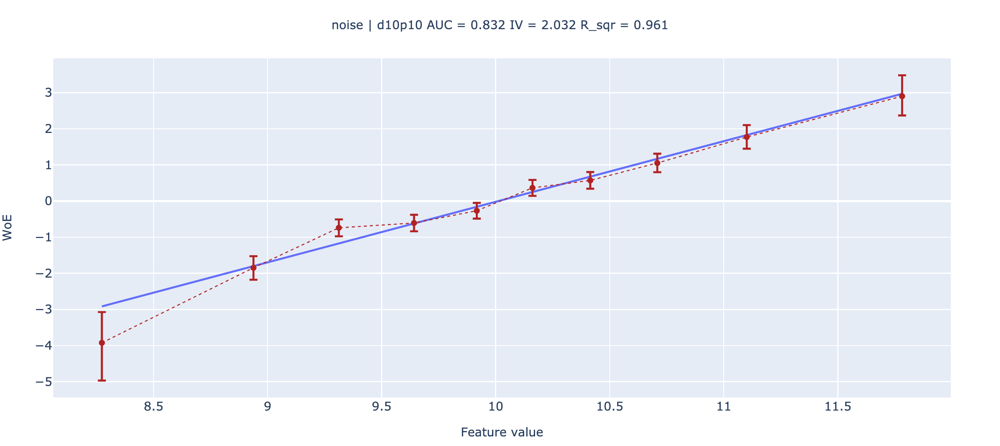

Нам нужно обратить внимание на 3 вещи:

**1. Фиолетовые точки с доверительными интервалами.**

Это WoE для каждого отдельного бакета. В идеале нам бы хотелось, чтобы **через эти точки можно было провести прямую линию** с небольшой погрешностью. Это и означает линейную взаимосвязь с таргетом.

**2. Синяя линия**

Попытка провести прямую линию через точки. Строится с помощью логистической регрессии на одной переменной. Затем предсказания переводятся в пространство WoE, отчего и получается прямая линия.

**3. Метрики в заголовке графика**

Метрики для признака:
 - roc auc, IV измеряют разделяющую способность переменной
 - $R^2$ измеряет *линейность взаимосвязи*. Признак считается линейным, если $R^2 \geq 0.95$

Далее напишем woe-line руками, чтобы в деталях разобраться, как он строится.

In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as sps
from typing import Union, Tuple

In [7]:
from IPython.display import Image, display

In [8]:
df = pd.read_csv('lr_hw_dataset.csv')

In [9]:
df

,Unnamed: 0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,d4p12
0,0,-1.444709,3.554779,1.308371,-0.000119,0.029628,3.829880,1,8.825418,3.829880,11.565953,-513.014565,-1.072893,7.936545,0.047069,B,1
1,1,1.132531,-0.207661,-2.142882,0.062686,0.859062,6.189545,1,3.453220,6.189545,4.935665,-39.351891,3.409855,17.015210,0.029288,A,0
2,2,1.268781,-0.243999,10000.000000,0.339225,0.614599,12.503629,1,-10.116061,12.503629,6.234414,-4.993050,3.121126,4.878602,0.237255,A,0
3,3,-1.278475,-2.579890,5.050763,-0.938956,0.090461,-1.080041,1,6.780814,-1.080041,2.682539,-509.273095,-1.242741,20.293025,0.907788,B,0
4,4,3.507807,0.152661,-8.905005,0.067646,0.216199,1.367184,1,-10.638134,1.367184,6.881602,-2.034797,2.814972,7.352399,0.276854,A,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99995,-3.061422,-0.163832,4.812768,-0.949937,0.224437,5.263508,1,-9.959913,5.263508,5.294558,-524.265291,-1.648415,5.410059,0.855190,B,0
99996,99996,0.222451,-0.273191,0.380895,0.860607,0.950708,0.581767,1,-1.645952,0.581767,5.571499,-13.499956,3.386865,92.903615,0.006668,A,1
99997,99997,1.078498,0.339526,-5.184847,0.242072,0.854085,0.995075,1,-5.565932,0.995075,-0.433263,3.928387,3.290285,1.233853,0.160933,A,1
99998,99998,-1.431421,-0.605388,2.466023,-0.056519,0.736255,2.980562,1,-4.517188,2.980562,10.812813,-507.593408,-1.398568,1904.246147,0.077164,B,1


In [10]:
df.dtypes

Unnamed: 0      int64
feature_1     float64
feature_2     float64
feature_3     float64
feature_4     float64
feature_5     float64
feature_6     float64
feature_7       int64
feature_8     float64
feature_9     float64
feature_10    float64
feature_11    float64
feature_12    float64
feature_13    float64
feature_14    float64
feature_15     object
d4p12           int64
dtype: object

In [11]:
df['feature_15'].unique()

array(['B', 'A'], dtype=object)

In [12]:
df['feature_7'].unique()

array([1, 0], dtype=int64)

### Шаг 0: разбиение на бакеты

In [14]:
def calc_buckets(x : Union[np.ndarray, pd.Series], n_buckets : int) -> np.ndarray:
    """Разбивает массив значений признака x на 
    n_buckets бакетов"""

    x = pd.Series(x).reset_index(drop=True)
    buckets = x.rank(method="dense", pct=True) * n_buckets
    buckets = np.ceil(buckets) - 1   # np.floor дает другой результат для 5.0, 6.0 и т.д.
    buckets = np.array(buckets, dtype=np.int16)

    return buckets

In [15]:
# протестируйте calc_buckets

for i in range(1, 16):
    if i != 7 and i != 15:
        print(f'Для признака {i} бакеты:')
        print(calc_buckets(x=df[f'feature_{i}'], n_buckets=5))

Для признака 1 бакеты:
[0 3 3 ... 3 0 3]
Для признака 2 бакеты:
[4 1 1 ... 3 0 1]
Для признака 3 бакеты:
[2 1 4 ... 0 3 1]
Для признака 4 бакеты:
[2 3 4 ... 4 1 2]
Для признака 5 бакеты:
[0 2 2 ... 2 2 1]
Для признака 6 бакеты:
[2 3 4 ... 1 2 3]
Для признака 8 бакеты:
[4 4 0 ... 1 1 1]
Для признака 9 бакеты:
[2 3 4 ... 1 2 3]
Для признака 10 бакеты:
[4 3 3 ... 1 4 2]
Для признака 11 бакеты:
[0 2 3 ... 4 1 3]
Для признака 12 бакеты:
[2 4 2 ... 3 0 3]
Для признака 13 бакеты:
[1 2 1 ... 0 4 3]
Для признака 14 бакеты:
[2 2 3 ... 3 2 1]


### Шаг 1: расчет WoE по бакетам (2 балла)

Пусть $x_i \in \{ 0, 1\}^n$

$x_i$ - это вектор, состоящий из значений таргета *в одном бакете* $i$. 

Для бакета можно посчитать количество единиц $B_i$ (bads, выпавшие в дефолт) и количество нулей $G_i$ (goods).

$$
B_i = \sum_{j \in x_i} \mathbb{I} \{ j = 1\}\quad G_i = \sum_{j \in x_i} \mathbb{I} \{ j = 0\}
$$

Также число бэдов и гудов можно посчитать и **для всей выборки**: 

$$
% X = x_1 \cup x_2 \ldots \cup x_n
X = \{x_1,\; x_2\; \ldots\; x_n\}
$$

$$
B = \sum_{j \in X} \mathbb{I} \{ j = 1\}\quad G = \sum_{j \in X} \mathbb{I} \{ j = 0\}
$$

Тогда WoE можно посчитать как

$$
\text{WoE}_i(x) = \ln \Big ( \frac{B_i}{G_i} \Big ) - \ln \Big ( \frac{B}{G} \Big ) 
$$

**Задание**

Убедиться, что

$$
\text{WoE}_i(x) = \text{logit}(b_i) - \text{logit}(b)\quad  (1)
$$

где 

$$
b = \frac{B}{B + G}\quad \text{logit}(p) = \ln \Big (  \frac{p}{1 - p} \Big )
$$

В дальнейшем будем считать WoE по формуле $(1)$

---

#### Приведу решение номера 2 из "Бонусных" номеров в качестве доказательства

#### Решение

$B = bad$
$G = good$
$B_i$
$X = \frac{B_i}{B_i+G_i}$ (просто $\mathbb{P}$ "плохого" исх.)

$WoE_i(x_i) = logit(badrate_i) - logit(badrate)$
$WoE_i(x_i) = logit \left( \frac{B_i}{B_i+G_i} \right) - logit \left( \frac{B}{B+G} \right)$ — требуется показать

**По частям:**
$\ln \left( \frac{B_i}{G_i} \right) = logit(badrate_i)$

$$\Rightarrow logit(badrate_i) = \ln \left( \frac{\frac{B_i}{B_i+G_i}}{1 - \frac{B_i}{B_i+G_i}} \right) =$$
$$= \ln \left( \frac{B_i}{B_i+G_i} \cdot \frac{B_i+G_i}{B_i+G_i - B_i} \right) =$$
$$= \ln \left( \frac{B_i}{B_i+G_i} \cdot \frac{B_i+G_i}{G_i} \right) = \ln \left( \frac{B_i}{G_i} \right)$$

Вывод для $badrate$ без индекса $i$ аналогичен.

**Следовательно:**
$logit(badrate_i) = \ln \left( \frac{B_i}{G_i} \right)$
$logit(badrate) = \ln \left( \frac{B}{G} \right)$

$$WoE_i(x_i) = logit(badrate_i) - logit(badrate) =$$
$$= \ln \left( \frac{B_i}{G_i} \right) - \ln \left( \frac{B}{G} \right)$$ (исходное опр-е, **ч.т.д.**)

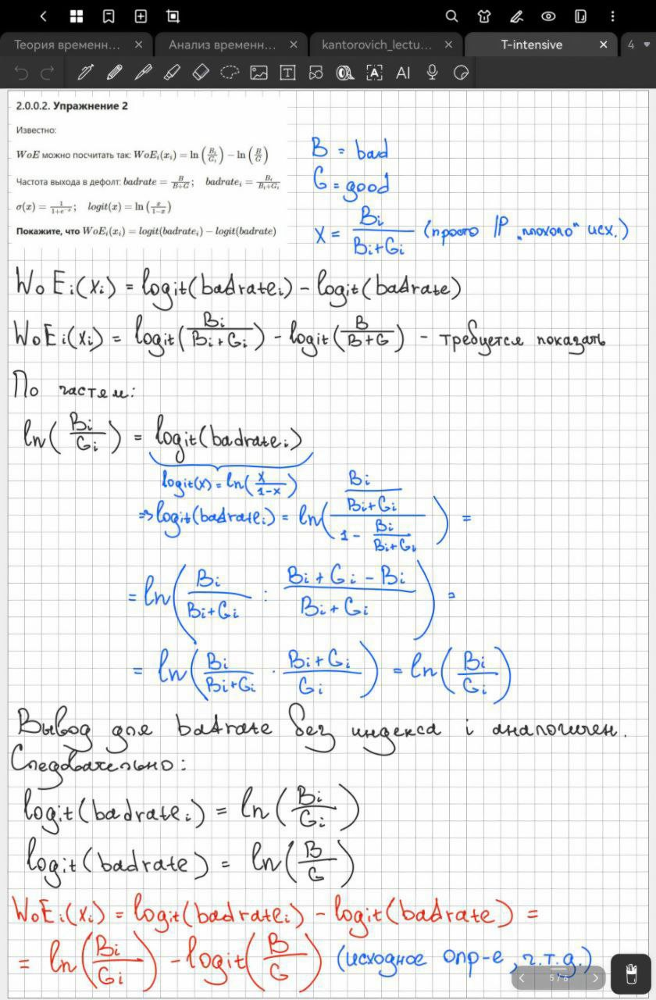

In [20]:
display(Image(filename="solution_picture2.jpg"))

In [21]:
from scipy.special import logit

def woe_transform(badrate : float, offset : float) -> float:
    """Считаем WoE для бакета с данным badrate и выборки
    с данным offset."""
    woe = logit(badrate) - offset
    return woe

Здесь и далее предлагается протестироать получившиеся функции. Нужно проверить, что
 - функция не ложится с ошибкой
 - возвращает то, что ожидается

In [23]:
# протестируй woe_transform

buckets = calc_buckets(df['feature_1'], n_buckets=10)

B = (df['d4p12'] == 1).sum()
G = (df['d4p12'] == 0).sum()

badrate = B / (B + G)
offset = logit(badrate)

for j in range(10):
    mask = buckets == j

    B_j = (df.loc[mask, 'd4p12'] == 1).sum()
    G_j = (df.loc[mask, 'd4p12'] == 0).sum()

    print(f'Для бакета {j} WoE для рассматриваемого признака равняется:')

    # пропускаем бакеты, где logit не определён
    if B_j == 0 or G_j == 0:
        print('WoE не определён (B_j = 0 или G_j = 0)\n')
        continue

    badrate_j = B_j / (B_j + G_j)

    woe = woe_transform(badrate=badrate_j, offset=offset)
    print(woe, '\n')

Для бакета 0 WoE для рассматриваемого признака равняется:
-0.8010478764570725 

Для бакета 1 WoE для рассматриваемого признака равняется:
-0.5209467705275299 

Для бакета 2 WoE для рассматриваемого признака равняется:
-0.36119062772405347 

Для бакета 3 WoE для рассматриваемого признака равняется:
-0.14234373072661954 

Для бакета 4 WoE для рассматриваемого признака равняется:
0.09767174404063364 

Для бакета 5 WoE для рассматриваемого признака равняется:
0.9431856495205433 

Для бакета 6 WoE для рассматриваемого признака равняется:
0.5858828518440495 

Для бакета 7 WoE для рассматриваемого признака равняется:
0.2895668599183753 

Для бакета 8 WoE для рассматриваемого признака равняется:
0.05310885992011624 

Для бакета 9 WoE для рассматриваемого признака равняется:
-0.289820810183919 



Ниже представлен шаблон функции, которая будет считать доверительный интервал к нашим вычислениям. Можно воспользоваться любым способом, который вам больше нравится. Для идей можно посмотреть различные способы подсчета доверительного интервала [здесь](https://en.wikipedia.org/wiki/Binomial_proportion_confidence_interval).

**P. S.**
Для того, чтобы построить доверительный интервал к $WoE$, можно сначала построить его для величины  $b_i = \frac{B_i}{B_i+G_i}$, а потом применить ```woe_transform```. В свою очередь величина $b_i$ является параметром распределения Бернулли, который мы можем оценить классическими методами (см. ссылку выше)

**Попробую использовать Wilson score interval**

In [26]:
from statsmodels.stats.proportion import proportion_confint

In [27]:
def woe_ci(target : np.ndarray, buckets : np.ndarray, offset : float) -> Tuple[pd.Series]:
    """Для каждого бакета вычисляем WoE и доверительный интервал для него."""

    woe = {}
    woe_lower = {}
    woe_upper = {}


    for j in np.unique(buckets):
        mask = buckets == j
        y_j = target[mask]
        
        B_j = (y_j == 1).sum()
        G_j = (y_j == 0).sum()
        n_j = B_j + G_j
        
        # если WoE не определён
        if B_j == 0 or G_j == 0:
            woe[j] = np.nan
            woe_lower[j] = np.nan
            woe_upper[j] = np.nan
            continue
        
        # badrate
        badrate_j = B_j / n_j

        # доверительный интервал для badrate по Уилсону
        badrate_low, badrate_up = proportion_confint(
            count=B_j,
            nobs=n_j,
            alpha=0.05,
            method='wilson'
        )
        
        # переход к WoE
        woe[j] = woe_transform(badrate_j, offset)
        woe_lower[j] = woe_transform(badrate_low, offset)
        woe_upper[j] = woe_transform(badrate_up, offset)

    
    # # считаем бэдрейт и доверительный интервал для него (любым способом)
    # badrate, badrate_lower, badrate_upper = None, None, None

    # # переходим от бэдрейта к woe
    # woe, woe_lower, woe_upper = None, None, None

    # return woe, woe_lower, woe_upper

    return (
            pd.Series(woe).sort_index(),
            pd.Series(woe_lower).sort_index(),
            pd.Series(woe_upper).sort_index()
        )

In [28]:
buckets = calc_buckets(df['feature_1'], 10)

B = (df['d4p12'] == 1).sum()
G = (df['d4p12'] == 0).sum()
offset = logit(B / (B + G))

woe, woe_l, woe_u = woe_ci(target=df['d4p12'].values, buckets=buckets, offset=offset)
print(woe)
print(woe_l)
print(woe_u)

0   -0.801048
1   -0.520947
2   -0.361191
3   -0.142344
4    0.097672
5    0.943186
6    0.585883
7    0.289567
8    0.053109
9   -0.289821
dtype: float64
0   -0.846344
1   -0.563498
2   -0.402554
3   -0.182506
4    0.058273
5    0.901950
6    0.546287
7    0.250369
8    0.013611
9   -0.330739
dtype: float64
0   -0.755752
1   -0.478395
2   -0.319828
3   -0.102181
4    0.137071
5    0.984422
6    0.625479
7    0.328764
8    0.092606
9   -0.248903
dtype: float64


### Шаг 2: расчет линейной интерполяции (1 балл)

In [30]:
from sklearn.linear_model import LogisticRegression

def calc_line(values : np.ndarray, target : np.ndarray, mean_feature : np.ndarray, offset : float) -> np.ndarray:
    """Строим линейную интерполяцию для WoE."""

    # строим логистическую регрессию на одном признаке
    # и считаем ее предсказания в точках - mean_feature
    
    # логрег на одном признаке
    lr = LogisticRegression(
        # penalty='None', # не регуляризую
        solver='lbfgs' # не принципиально, пробовал разные, результаты схожие 
        # (кроме того, что некоторые солверы игнорируют мультиколлинеарность)
    )
    
    # обучаем
    lr.fit(values.reshape(-1, 1), target)
    
    # предсказываем вероятность bad в точках mean_feature
    proba = lr.predict_proba(mean_feature.reshape(-1, 1))[:, 1]
    
    # применяем ранее написанную функцию
    line = woe_transform(proba, offset)
    return line

In [31]:
# протестируйте calc_line

x = df['feature_1'].values
y = df['d4p12'].values

buckets = calc_buckets(x, n_buckets=10)

# средние значения признака по бакетам
mean_feature = pd.Series(x).groupby(buckets).mean().values

B = (y == 1).sum()
G = (y == 0).sum()
offset = logit(B / (B + G))

line = calc_line(
    values=x,
    target=y,
    mean_feature=mean_feature,
    offset=offset
)

line

array([-0.28495439, -0.10879816, -0.06523039, -0.03911094, -0.01889053,
        0.01515353,  0.03565465,  0.06150778,  0.10520799,  0.28050365])

### Шаг3: собираем результаты по бакетам в один словарь (1 балл)

In [33]:
def calc_buckets_info(values : np.ndarray, target : np.ndarray, buckets : np.ndarray) -> dict:
    """Для каждого бакета расчитывает
     - среднее значение признака
     - линейную интерполяцию в пространстве woe
     - значение woe и доверительный интервал для него"""

    # buckets_info = {
    #     "mean_feature" : None,
    #     "line"         : None,
    #     "woe"          : None,
    #     "woe_lower"    : None,
    #     "woe_upper"    : None
    # }

    # средние значения признака по бакетам
    mean_feature = (
        pd.Series(values)
        .groupby(buckets)
        .mean()
        .sort_index()
        .values
    )

    # offset
    B = (target == 1).sum()
    G = (target == 0).sum()
    offset = logit(B / (B + G))

    # WoE и доверительные интервалы
    woe, woe_lower, woe_upper = woe_ci(
        target=target,
        buckets=buckets,
        offset=offset
    )

    # линейная интерполяция
    line = calc_line(
        values=values,
        target=target,
        mean_feature=mean_feature,
        offset=offset
    )

    buckets_info = {
        "mean_feature": mean_feature,
        "line": line,
        "woe": woe,
        "woe_lower": woe_lower,
        "woe_upper": woe_upper
    }

    return buckets_info

In [34]:
# протестируйте calc_buckets_info
x = df['feature_1'].values
y = df['d4p12'].values
buckets = calc_buckets(x, n_buckets=10)

info = calc_buckets_info(
    values=x,
    target=y,
    buckets=buckets
)

info

{'mean_feature': array([-4.55444328, -1.72260133, -1.02221712, -0.60232748, -0.2772695 ,
         0.27001405,  0.59958468,  1.01519297,  1.7177062 ,  4.535714  ]),
 'line': array([-0.28495439, -0.10879816, -0.06523039, -0.03911094, -0.01889053,
         0.01515353,  0.03565465,  0.06150778,  0.10520799,  0.28050365]),
 'woe': 0   -0.801048
 1   -0.520947
 2   -0.361191
 3   -0.142344
 4    0.097672
 5    0.943186
 6    0.585883
 7    0.289567
 8    0.053109
 9   -0.289821
 dtype: float64,
 'woe_lower': 0   -0.846344
 1   -0.563498
 2   -0.402554
 3   -0.182506
 4    0.058273
 5    0.901950
 6    0.546287
 7    0.250369
 8    0.013611
 9   -0.330739
 dtype: float64,
 'woe_upper': 0   -0.755752
 1   -0.478395
 2   -0.319828
 3   -0.102181
 4    0.137071
 5    0.984422
 6    0.625479
 7    0.328764
 8    0.092606
 9   -0.248903
 dtype: float64}

### Шаг 4: считаем метрики признака (2 балла)

Рассчитаем также несколько метрик, чтобы судить о качестве признака не только по картинкам. 

Приведем формулу для IV:

$$
\text{IV}(x) = \sum_{i = 1}^{n}\Big ( \frac{B_i}{B} - \frac{G_i}{G} \Big ) \times \text{WoE}_i
$$

**Вопрос:** зачем считать ранжирующую силу признака двумя способами? Какую дополнительную информацию может дать IV относительно roc auc?

**Ответ:** "I𝑉 «ловит» немонотонности по 𝑊𝑜𝐸 и позволяет понимать, когда фича разделяет риски, но плохо ранжирует наблюдения"

То есть, IV чувствителен к структуре WoE по бакетам и позволяет выявлять признаки, которые локально хорошо разделяют риски, но при этом обеспечивают слабое глобальное ранжирование наблюдений, что не всегда отражается в значении ROC AUC.

In [38]:
from sklearn.metrics import roc_auc_score

def calc_plot_title(
        values : np.ndarray,
        target : np.ndarray,
        buckets : np.ndarray
    ) -> str:
    """Считает для признака roc auc, IV, R^2"""
    # auc = None
    auc = roc_auc_score(target, values)

    # формула выше
    # IV = None

    B = (target == 1).sum()
    G = (target == 0).sum()

    IV = 0.0

    for j in np.unique(buckets):
        mask = buckets == j
        y_j = target[mask]

        B_j = (y_j == 1).sum()
        G_j = (y_j == 0).sum()
        
        if B_j == 0 or G_j == 0:
            continue

        woe_j = np.log((B_j / G_j) / (B / G))

        IV += (B_j / B - G_j / G) * woe_j

    # используем ранее написанную функцию
    info = calc_buckets_info(
        values=values,
        target=target,
        buckets=buckets
    )

    mean_feature = info["mean_feature"]
    woe = info["woe"].values
    line = info["line"]

    # веса бакетов - число наблюдений в бакете
    weights = np.array([
        (buckets == j).sum()
        for j in np.unique(buckets)
    ])

    # Взвешенный R^2 
    # X - среднее в бакете, Y - woe в бакете, вес - число наблюдений в бакете
    # R_sqr = None
    w_mean = np.average(woe, weights=weights)
    ss_tot = np.sum(weights * (woe - w_mean) ** 2)

    # линейная инт.
    ss_res = np.sum(weights * (woe - line) ** 2)

    R_sqr = 1 - ss_res / ss_tot

    plot_title = (        
        f"AUC = {auc:.3f} "
        f"IV = {IV:.3f} "
        f"R_sqr = {R_sqr:.3f} "
    )

    return plot_title


In [39]:
# протестируйте calc_plot_title


for i in range(1, 16):
    if i != 7 and i!= 15:
        
        x = df[f'feature_{i}'].values
        y = df['d4p12'].values
        buckets = calc_buckets(x, n_buckets=10)
        
        title = calc_plot_title(
            values=x,
            target=y,
            buckets=buckets
        )
        print(f'Для признака {i} метрики качества равны {title}')

Для признака 1 метрики качества равны AUC = 0.570 IV = 0.239 R_sqr = 0.155 
Для признака 2 метрики качества равны AUC = 0.514 IV = 0.200 R_sqr = -0.000 
Для признака 3 метрики качества равны AUC = 0.474 IV = 0.100 R_sqr = -0.051 
Для признака 4 метрики качества равны AUC = 0.579 IV = 0.103 R_sqr = 0.409 
Для признака 5 метрики качества равны AUC = 0.500 IV = 0.000 R_sqr = 0.001 
Для признака 6 метрики качества равны AUC = 0.502 IV = 0.000 R_sqr = 0.155 
Для признака 8 метрики качества равны AUC = 0.507 IV = 0.001 R_sqr = 0.863 
Для признака 9 метрики качества равны AUC = 0.502 IV = 0.000 R_sqr = 0.155 
Для признака 10 метрики качества равны AUC = 0.504 IV = 0.000 R_sqr = 0.442 
Для признака 11 метрики качества равны AUC = 0.722 IV = 1.335 R_sqr = 0.236 
Для признака 12 метрики качества равны AUC = 0.715 IV = 1.196 R_sqr = 0.165 
Для признака 13 метрики качества равны AUC = 0.468 IV = 0.031 R_sqr = 0.235 
Для признака 14 метрики качества равны AUC = 0.373 IV = 0.200 R_sqr = 0.795 


### Шаг 5: собираем все в одну функцию и строим график

In [41]:
# в этот код можно не въезжать :)
import plotly.graph_objects as go

def make_figure(buckets_info : dict, plot_title : str) -> go.Figure:
    """Строит график линейности."""
    fig = go.Figure()

    # общие настройки
    title = dict(
        text=plot_title,
        y=0.95,
        x=0.5,
        font=dict(size=12),
        xanchor="center",
        yanchor="top"
    )
    margin = go.layout.Margin(
        l=50,
        r=50,
        b=50,
        t=60
    )

    fig.add_trace(
        go.Scatter(
            x=buckets_info["mean_feature"],
            y=buckets_info["line"],
            mode='lines',
            name="interpolation_line",
            showlegend=False
        )
    )

    fig.add_trace(
        go.Scatter(
            x=buckets_info["mean_feature"],
            y=buckets_info["woe"],
            line=dict(
                color='firebrick',
                width=1,
                dash='dot'
            ),
            error_y=dict(
                type='data',
                symmetric=False,
                array=buckets_info["woe_upper"],
                arrayminus=buckets_info["woe_lower"]
            ),
            name="WoE",
            showlegend=False)
    )

    fig.update_layout(
        width=1000,
        height=450,
        xaxis_title=dict(
            text='Feature value',
            font=dict(size=12)
        ),
        yaxis_title=dict(
            text="WoE",
            font=dict(size=12)
        ),
        title=title,
        margin=margin
    )

    return fig

In [42]:
def woe_line(
        values : np.ndarray,
        target : np.ndarray,
        n_buckets : int
    ) -> go.Figure:
    """График линейности переменной по WoE."""
    buckets : np.ndarray = calc_buckets(values, n_buckets)
    buckets_info : pd.DataFrame = calc_buckets_info(values, target, buckets)
    plot_title : str = calc_plot_title(values, target, buckets)
    fig = make_figure(buckets_info, plot_title)
    return fig

Чтобы протестировать реализацию, сгенерируем синтетические данные:

In [44]:
sample_size = int(1e4)
noise_std = 1.

df_test = pd.DataFrame()
y = np.array(sample_size // 2 * [0] + sample_size // 2 * [1])
df_test['target']  = y

np.random.seed(89)
x = np.concatenate([sps.norm(0, noise_std).rvs(size = sample_size // 2), sps.norm(1, noise_std).rvs(size = sample_size // 2)])
df_test['feature'] = x

<Axes: xlabel='feature', ylabel='Count'>

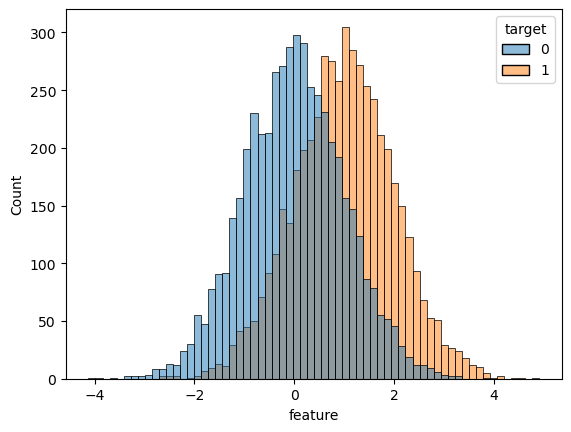

In [45]:
sns.histplot(df_test, x = 'feature', hue = 'target')

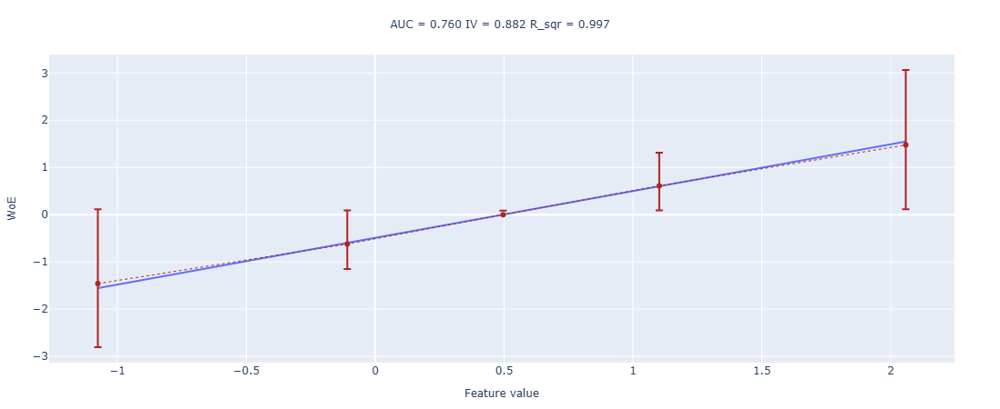

In [46]:
# запустите после того, как реализуете все функции 
woe_line(values=x, target=y, n_buckets=5)

### Эксперименты (2 балл)

#### №1 

Как будут меняться график, метрики разделяющей способности и $R^2$ при изменении дисперсии шума (параметр `noise_std`)? 

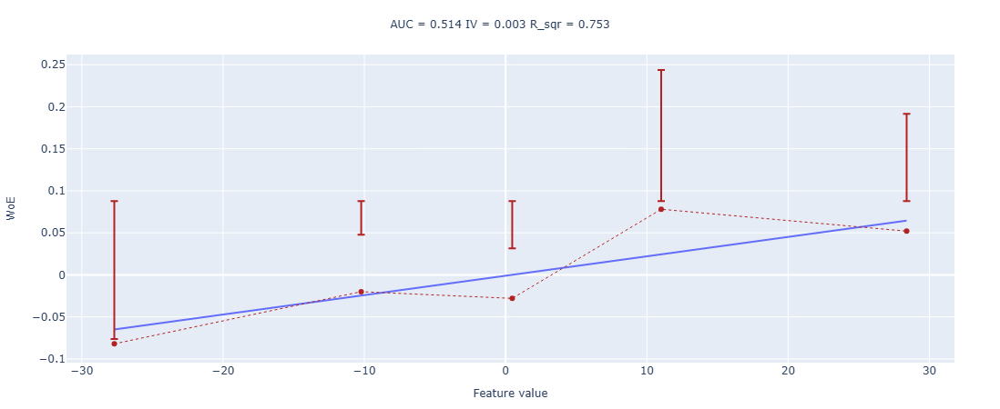

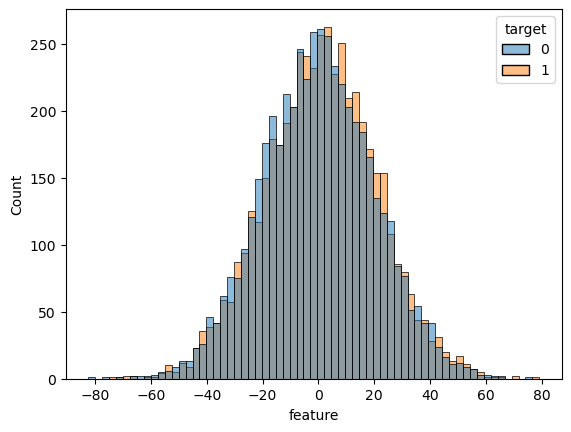

In [49]:
sample_size = int(1e4)
noise_std = 20.

df_test = pd.DataFrame()
y = np.array(sample_size // 2 * [0] + sample_size // 2 * [1])
df_test['target']  = y

np.random.seed(89)
x = np.concatenate([sps.norm(0, noise_std).rvs(size = sample_size // 2), sps.norm(1, noise_std).rvs(size = sample_size // 2)])
df_test['feature'] = x

sns.histplot(df_test, x = 'feature', hue = 'target')

# запустите после того, как реализуете все функции 
woe_line(values=x, target=y, n_buckets=5)

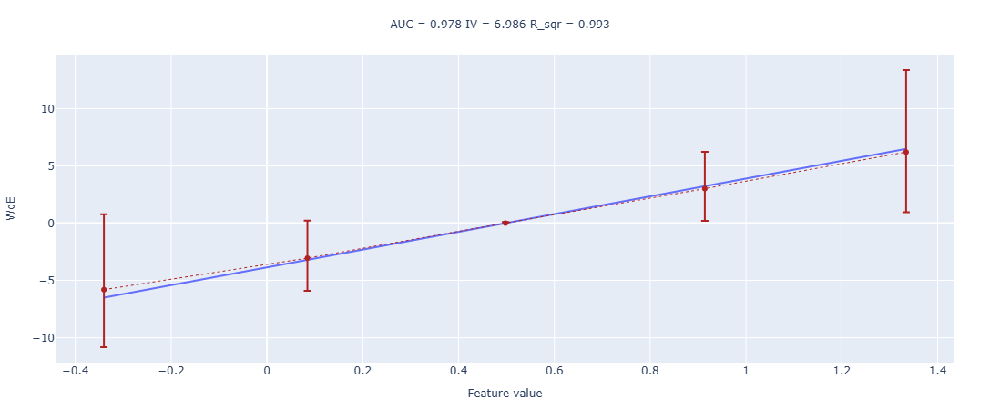

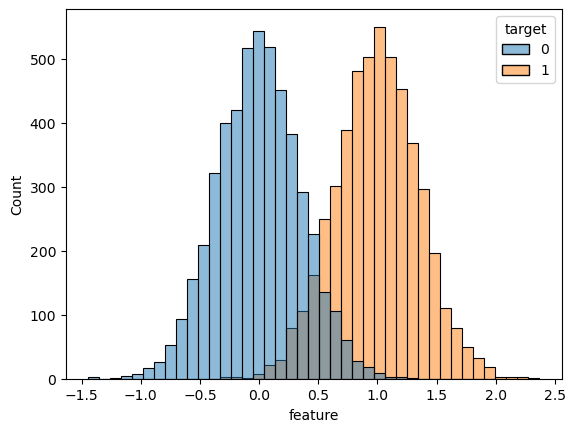

In [50]:
sample_size = int(1e4)
noise_std = 0.35

df_test = pd.DataFrame()
y = np.array(sample_size // 2 * [0] + sample_size // 2 * [1])
df_test['target']  = y

np.random.seed(89)
x = np.concatenate([sps.norm(0, noise_std).rvs(size = sample_size // 2), sps.norm(1, noise_std).rvs(size = sample_size // 2)])
df_test['feature'] = x

sns.histplot(df_test, x = 'feature', hue = 'target')

# запустите после того, как реализуете все функции 
woe_line(values=x, target=y, n_buckets=5)

#### Выводы: при большом шуме признак теряет разделяющую способность, хотя зависимость по WoE может выглядеть линейной, что делает его линейным, но не совсем полезным. При малом шуме же признак одновременно хорошо разделяет классы и демонстрирует почти идеальную линейность по WoE, что делает его подходящим для логистической регрессии.

#### №2 

Запустите функцию с `values=x ** 2`. Как по графику определить эту ситуацию? Что нужно делать в таком случае?

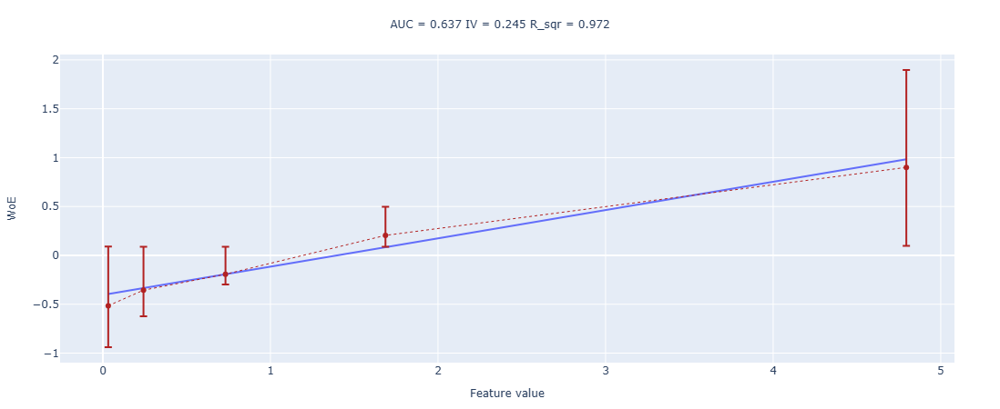

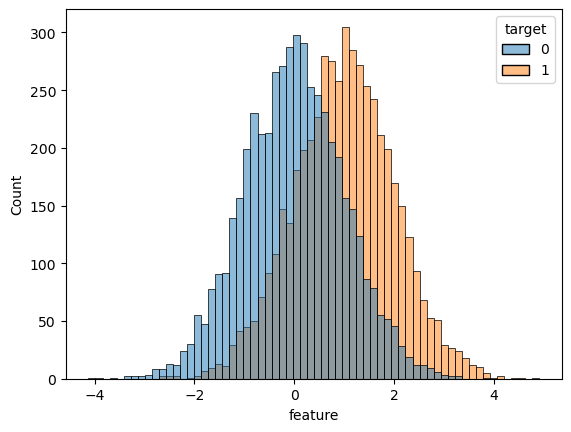

In [53]:
sample_size = int(1e4)
noise_std = 1

df_test = pd.DataFrame()
y = np.array(sample_size // 2 * [0] + sample_size // 2 * [1])
df_test['target']  = y

np.random.seed(89)
x = np.concatenate([sps.norm(0, noise_std).rvs(size = sample_size // 2), sps.norm(1, noise_std).rvs(size = sample_size // 2)])
df_test['feature'] = x

sns.histplot(df_test, x = 'feature', hue = 'target')

# запустите после того, как реализуете все функции 
woe_line(values=x ** 2, target=y, n_buckets=5)

По графику видно, что WoE растёт почти по прямой и даёт высокий R^2, но при этом AUC остаётся лишь умеренным - линейность получается «формальной», а не отражающей реальное ранжирование.
В такой ситуации признак нельзя считать корректно линейным для логистической регрессии: нужно возвращаться к исходному признаку или применять биннинг/нелинейные преобразования, а не использовать его напрямую.

#### №3

Запустите функцию с `values=np.exp(x)`. Как по графику определить эту ситуацию? Что нужно делать в таком случае?

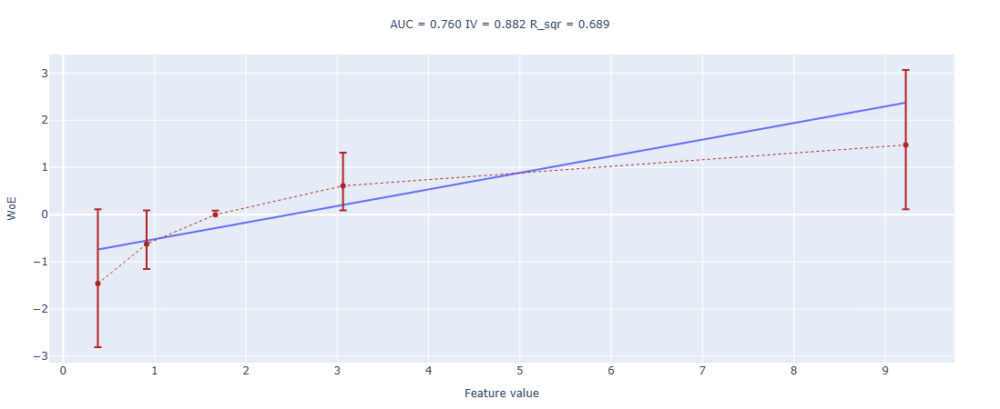

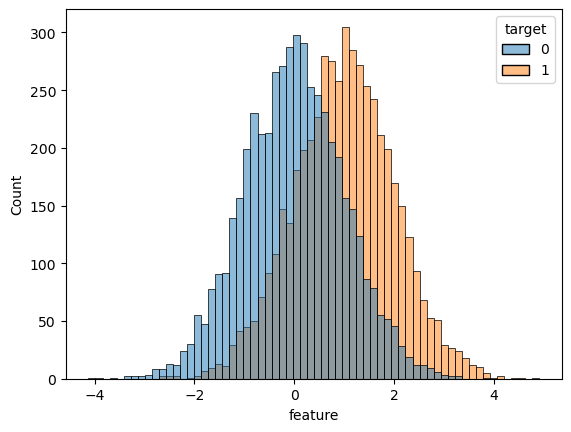

In [56]:
sample_size = int(1e4)
noise_std = 1

df_test = pd.DataFrame()
y = np.array(sample_size // 2 * [0] + sample_size // 2 * [1])
df_test['target']  = y

np.random.seed(89)
x = np.concatenate([sps.norm(0, noise_std).rvs(size = sample_size // 2), sps.norm(1, noise_std).rvs(size = sample_size // 2)])
df_test['feature'] = x

sns.histplot(df_test, x = 'feature', hue = 'target')

# запустите после того, как реализуете все функции 
woe_line(values=np.exp(x), target=y, n_buckets=5)

По графику видно, что WoE в целом растёт, но точки заметно отклоняются от прямой, доверительные интервалы асимметричны и расширяются на правом хвосте, R^2 падает ниже порога линейности - это признак искажения шкалы из-за экспоненциального растяжения значений.

В такой ситуации признак нельзя использовать напрямую в логистической регрессии: его нужно приводить к более "линейной" шкале (например, логарифмировать, бинировать и считать WoE) либо применять модель, устойчивую к нелинейным преобразованиям.

## Часть 2. Строим ЛогРег. (5 баллов)

В этом пунтке попробуем применить все наши навыки 

Скачайте датасет по [ссылке](https://data.tinkoff.ru/s/Nca7PoTNYokXgNF). Пароль вы найдете в телеграм-канале курса, в посте с анонсом домашки.

##### ЭТО ПРИЛОЖЕННЫЙ ДАТАСЕТ? ПО ССЫЛКЕ НЕТ ДОСТУПА, ИСПОЛЬЗУЮ ПРИЛОЖЕННЫЙ, Т. К. ПРИЗНАКИ ТЕ ЖЕ ПО ОПИСАНИЮ.

In [61]:
# df = pd.read_csv('risks-24-hw1.csv', index_col=0)
df

,Unnamed: 0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,d4p12
0,0,-1.444709,3.554779,1.308371,-0.000119,0.029628,3.829880,1,8.825418,3.829880,11.565953,-513.014565,-1.072893,7.936545,0.047069,B,1
1,1,1.132531,-0.207661,-2.142882,0.062686,0.859062,6.189545,1,3.453220,6.189545,4.935665,-39.351891,3.409855,17.015210,0.029288,A,0
2,2,1.268781,-0.243999,10000.000000,0.339225,0.614599,12.503629,1,-10.116061,12.503629,6.234414,-4.993050,3.121126,4.878602,0.237255,A,0
3,3,-1.278475,-2.579890,5.050763,-0.938956,0.090461,-1.080041,1,6.780814,-1.080041,2.682539,-509.273095,-1.242741,20.293025,0.907788,B,0
4,4,3.507807,0.152661,-8.905005,0.067646,0.216199,1.367184,1,-10.638134,1.367184,6.881602,-2.034797,2.814972,7.352399,0.276854,A,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99995,-3.061422,-0.163832,4.812768,-0.949937,0.224437,5.263508,1,-9.959913,5.263508,5.294558,-524.265291,-1.648415,5.410059,0.855190,B,0
99996,99996,0.222451,-0.273191,0.380895,0.860607,0.950708,0.581767,1,-1.645952,0.581767,5.571499,-13.499956,3.386865,92.903615,0.006668,A,1
99997,99997,1.078498,0.339526,-5.184847,0.242072,0.854085,0.995075,1,-5.565932,0.995075,-0.433263,3.928387,3.290285,1.233853,0.160933,A,1
99998,99998,-1.431421,-0.605388,2.466023,-0.056519,0.736255,2.980562,1,-4.517188,2.980562,10.812813,-507.593408,-1.398568,1904.246147,0.077164,B,1


Как вы выдите, ```feature_1, ..., feature_14``` - числа 
```feature_15``` - категориальная фича

### Задание 0. EDA.

Как бы вы начали знакомиться с данными до построения модели? Постройте 3-5 графиков / таблиц, чтобы передать основную информацию о датасете.

In [65]:
df.isna().mean(), df.isna().mean()

(Unnamed: 0    0.0
 feature_1     0.0
 feature_2     0.0
 feature_3     0.0
 feature_4     0.0
 feature_5     0.0
 feature_6     0.0
 feature_7     0.0
 feature_8     0.0
 feature_9     0.0
 feature_10    0.0
 feature_11    0.0
 feature_12    0.0
 feature_13    0.0
 feature_14    0.0
 feature_15    0.0
 d4p12         0.0
 dtype: float64,
 Unnamed: 0    0.0
 feature_1     0.0
 feature_2     0.0
 feature_3     0.0
 feature_4     0.0
 feature_5     0.0
 feature_6     0.0
 feature_7     0.0
 feature_8     0.0
 feature_9     0.0
 feature_10    0.0
 feature_11    0.0
 feature_12    0.0
 feature_13    0.0
 feature_14    0.0
 feature_15    0.0
 d4p12         0.0
 dtype: float64)

In [66]:
df.dtypes

Unnamed: 0      int64
feature_1     float64
feature_2     float64
feature_3     float64
feature_4     float64
feature_5     float64
feature_6     float64
feature_7       int64
feature_8     float64
feature_9     float64
feature_10    float64
feature_11    float64
feature_12    float64
feature_13    float64
feature_14    float64
feature_15     object
d4p12           int64
dtype: object

In [67]:
df['feature_7'].unique()

array([1, 0], dtype=int64)

In [68]:
df['feature_15'].unique()

array(['B', 'A'], dtype=object)

In [69]:
import matplotlib.pyplot as plt

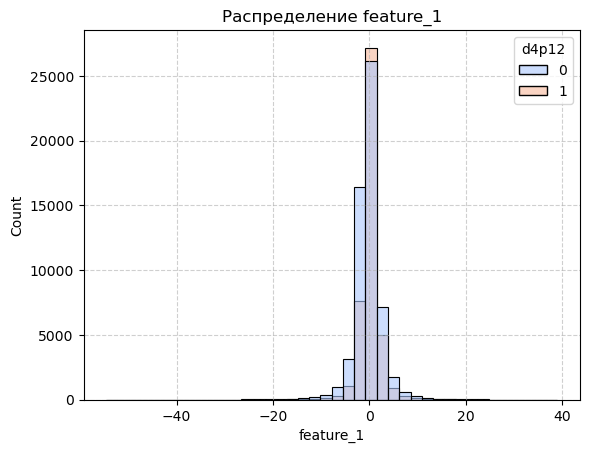

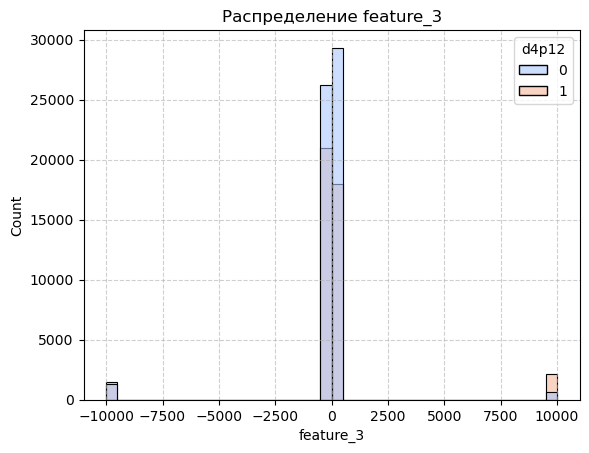

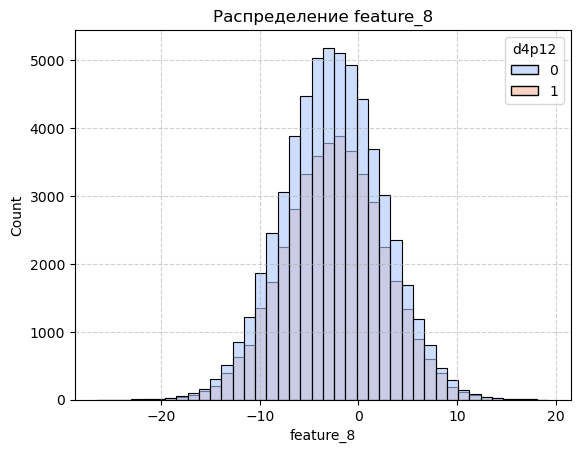

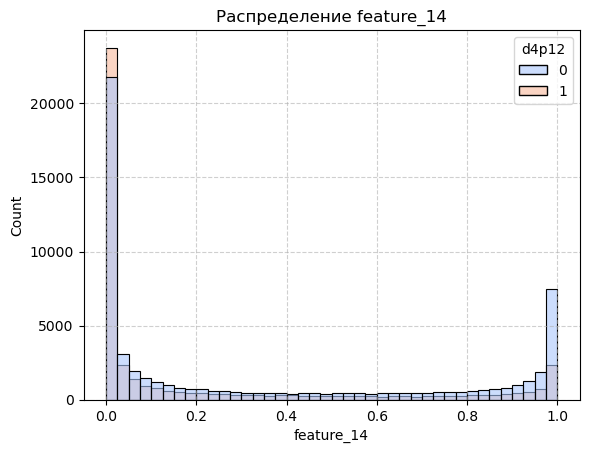

In [70]:
features = ['feature_1', 'feature_3', 'feature_8', 'feature_14']

for col in features:
    sns.histplot(
        data=df,
        x=col,
        hue='d4p12',
        palette='coolwarm',
        bins=40,
        alpha=0.6
    )
    plt.title(f'Распределение {col}')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

##### Объявим переменные

In [72]:
df.head()

,Unnamed: 0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,d4p12
0,0,-1.444709,3.554779,1.308371,-0.000119,0.029628,3.829880,1,8.825418,3.829880,11.565953,-513.014565,-1.072893,7.936545,0.047069,B,1
1,1,1.132531,-0.207661,-2.142882,0.062686,0.859062,6.189545,1,3.453220,6.189545,4.935665,-39.351891,3.409855,17.015210,0.029288,A,0
2,2,1.268781,-0.243999,10000.000000,0.339225,0.614599,12.503629,1,-10.116061,12.503629,6.234414,-4.993050,3.121126,4.878602,0.237255,A,0
3,3,-1.278475,-2.579890,5.050763,-0.938956,0.090461,-1.080041,1,6.780814,-1.080041,2.682539,-509.273095,-1.242741,20.293025,0.907788,B,0
4,4,3.507807,0.152661,-8.905005,0.067646,0.216199,1.367184,1,-10.638134,1.367184,6.881602,-2.034797,2.814972,7.352399,0.276854,A,0


In [73]:
# # A = 0, b = 1
# df['feature_15_binary'] = (df['feature_15'] == 'B').astype(int)

In [74]:
target = df['d4p12']
numeric_features = [
    'feature_1', 'feature_2', 'feature_3', 
    'feature_4', 'feature_5', 'feature_6', 'feature_8', 'feature_9',
    'feature_10', 'feature_11', 'feature_12', 'feature_13', 'feature_14'
]
binary_numeric_features = ['feature_7']
# cat_features = ['feature_15_binary']

model_features = numeric_features + binary_numeric_features

### Задание 1. Бейзлайн.

Попробуйте построить ЛогРег только на числовых данных. Для этого разбейте датасет на трейн и тест (80/20). Перед обучением логрега стандартизуйте переменные. Это может быть полезно для численной устойчивости алгоритмов оптимизации.

Для этой модели и всех дальнейших:

1. Получилась ли модель линейной? Постройте график линейности на трейне и на тесте и сделайте вывод.
2. Расчитайте AUC и IV на трейне и на тесте. Что можно сказать о переобучении?

In [77]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

In [78]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [79]:
x = df[numeric_features + binary_numeric_features]
y = df['d4p12']

X_train, X_test, y_train, y_test = train_test_split(
    x, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

In [80]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

In [81]:
logreg = LogisticRegression(
    max_iter=1500,
    solver='lbfgs'
)

logreg.fit(X_train_scaled, y_train)

LogisticRegression(max_iter=1500)

In [82]:
auc_train = roc_auc_score(y_train, logreg.predict_proba(X_train_scaled)[:, 1])
auc_test  = roc_auc_score(y_test,  logreg.predict_proba(X_test_scaled)[:, 1])

auc_train, auc_test

(0.7054787669915431, 0.7143423203483006)

In [83]:
buckets_train = calc_buckets(logreg.predict_proba(X_train_scaled)[:, 1], n_buckets=10)

title_train = calc_plot_title(
    values=logreg.predict_proba(X_train_scaled)[:, 1],
    target=y_train.values,
    buckets=buckets_train
)

print(title_train)

buckets_test  = calc_buckets(logreg.predict_proba(X_test_scaled)[:, 1], n_buckets=10)

title_test  = calc_plot_title(
    values=logreg.predict_proba(X_test_scaled)[:, 1],
    target=y_test.values,
    buckets=buckets_test
)

print(title_test)

AUC = 0.705 IV = 0.592 R_sqr = 0.969 
AUC = 0.714 IV = 0.637 R_sqr = 0.976 


### Несмотря на отсутствие переобучения и более-менее приемлемые результаты, большинство признаков нелинейно к таргету (увидем далее и видели ранее, так как считал на этом же датасете все функции).

### Задание 2. Добавляем категориальную переменную.

Повторите задание 1, включив в модель категориальную переменную (например, с помощью one-hot encoding).

Улучшилось ли качество?

In [87]:
df['feature_15_binary'] = (df['feature_15'] == 'B').astype(int)
cat_features = ['feature_15_binary']

model_features = numeric_features + binary_numeric_features + cat_features

In [88]:
x = df[model_features]
y = target

X_train, X_test, y_train, y_test = train_test_split(
    x, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)


logreg = LogisticRegression(
    max_iter=1500,
    solver='lbfgs'
)

logreg.fit(X_train_scaled, y_train)

auc_train = roc_auc_score(y_train, logreg.predict_proba(X_train_scaled)[:, 1])
auc_test  = roc_auc_score(y_test,  logreg.predict_proba(X_test_scaled)[:, 1])

auc_train, auc_test

(0.8604055079169484, 0.8596895002074798)

#### Улучшилось! Сравню с катбуст-энкодингом:

In [90]:
import category_encoders as ce

In [91]:
cat_columns = ['feature_15_binary']

target_enc = ce.CatBoostEncoder(
    cols=cat_columns,
    random_state=42
)

target_enc.fit(X_train[cat_columns], y_train)

X_train_cb = (
    target_enc
    .transform(X_train[cat_columns])
    .add_suffix('_cb')
)

X_test_cb = (
    target_enc
    .transform(X_test[cat_columns])
    .add_suffix('_cb')
)

X_train = X_train.join(X_train_cb).drop(columns=cat_columns)
X_test  = X_test.join(X_test_cb).drop(columns=cat_columns)

model_features = numeric_features + binary_numeric_features + ['feature_15_binary_cb']

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train[model_features])
X_test_scaled  = scaler.transform(X_test[model_features])

In [92]:
logreg = LogisticRegression(
    max_iter=1500,
    solver='lbfgs'
)

logreg.fit(X_train_scaled, y_train)

auc_train = roc_auc_score(
    y_train,
    logreg.predict_proba(X_train_scaled)[:, 1]
)

auc_test = roc_auc_score(
    y_test,
    logreg.predict_proba(X_test_scaled)[:, 1]
)

auc_train, auc_test

(0.8604055079169484, 0.8596895002074798)

In [93]:
for col in numeric_features:
    buckets_train = calc_buckets(X_train[col].values, n_buckets=10)
    buckets_test  = calc_buckets(X_test[col].values,  n_buckets=10)

    title_train = calc_plot_title(
        values=X_train[col].values,
        target=y_train.values,
        buckets=buckets_train
    )

    title_test = calc_plot_title(
        values=X_test[col].values,
        target=y_test.values,
        buckets=buckets_test
    )

    print(col)
    print("train:", title_train)
    print("test: ", title_test)
    print()

feature_1
train: AUC = 0.569 IV = 0.240 R_sqr = 0.151 
test:  AUC = 0.572 IV = 0.235 R_sqr = 0.168 

feature_2
train: AUC = 0.513 IV = 0.197 R_sqr = -0.000 
test:  AUC = 0.520 IV = 0.216 R_sqr = 0.000 

feature_3
train: AUC = 0.475 IV = 0.098 R_sqr = -0.052 
test:  AUC = 0.471 IV = 0.110 R_sqr = -0.050 

feature_4
train: AUC = 0.577 IV = 0.100 R_sqr = 0.407 
test:  AUC = 0.584 IV = 0.112 R_sqr = 0.413 

feature_5
train: AUC = 0.499 IV = 0.000 R_sqr = 0.033 
test:  AUC = 0.505 IV = 0.002 R_sqr = 0.092 

feature_6
train: AUC = 0.501 IV = 0.000 R_sqr = 0.166 
test:  AUC = 0.502 IV = 0.001 R_sqr = 0.025 

feature_8
train: AUC = 0.506 IV = 0.001 R_sqr = 0.708 
test:  AUC = 0.512 IV = 0.003 R_sqr = 0.601 

feature_9
train: AUC = 0.501 IV = 0.000 R_sqr = 0.166 
test:  AUC = 0.502 IV = 0.001 R_sqr = 0.025 

feature_10
train: AUC = 0.505 IV = 0.001 R_sqr = 0.354 
test:  AUC = 0.499 IV = 0.002 R_sqr = -0.009 

feature_11
train: AUC = 0.721 IV = 1.319 R_sqr = 0.236 
test:  AUC = 0.726 IV = 1.379 

### Задание 3. Линеаризация переменных.

На самом деле, категориальные переменные можно учитывать в моделях совсем по-другому. С их помощью можно выделить в модели сегменты. Каждому сегменту соответствует своя модель (в нашем случае логрег). 

Примером такой сегментации может стать сегментация по наличию кредитной истории. В этом случае на разных сегментах будут не просто отдельные модели, но и даже разный изначальный набор признаков. Другое свидетельство удачной сегментации – разный характер зависимости признаков и целевой переменной. Это можно увидеть на графике линейности признака по WoE. Этим мы и займемся далее.

Используйте переменную 15 для сегментации модели. На каждом из двух сегментов линеаризуйте переменные. Для этого приложите:
 - график линейности переменной до преобразования
 - график после подобранного преобразования

Помимо этого:
 - попробуйте линеаризовать какие-нибудь 2 переменные *на всей выборке*. Получилось ли у вас что-то? Постройте график.
 - по графику линейности определите шумовые (либо слабоинформативные) переменные. В конце задания приложите их список.

In [96]:
# сегмент A
df_A = df[df['feature_15_binary'] == 0]
# сегмент B
df_B = df[df['feature_15_binary'] == 1]


feature_1 | сегмент A (feature_15_binary = 0)


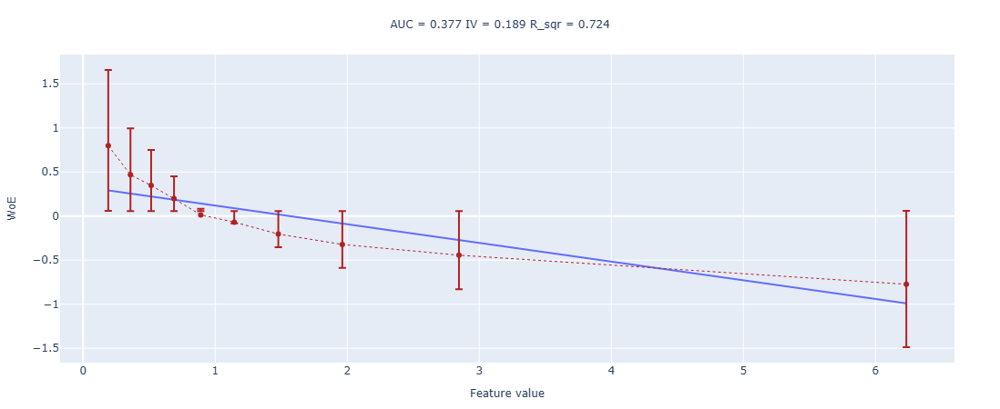


feature_1 | сегмент B (feature_15_binary = 1)


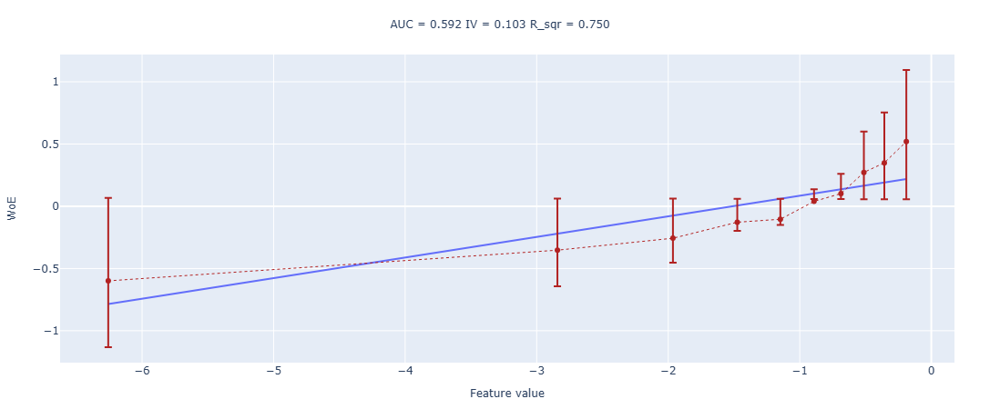


feature_2 | сегмент A (feature_15_binary = 0)


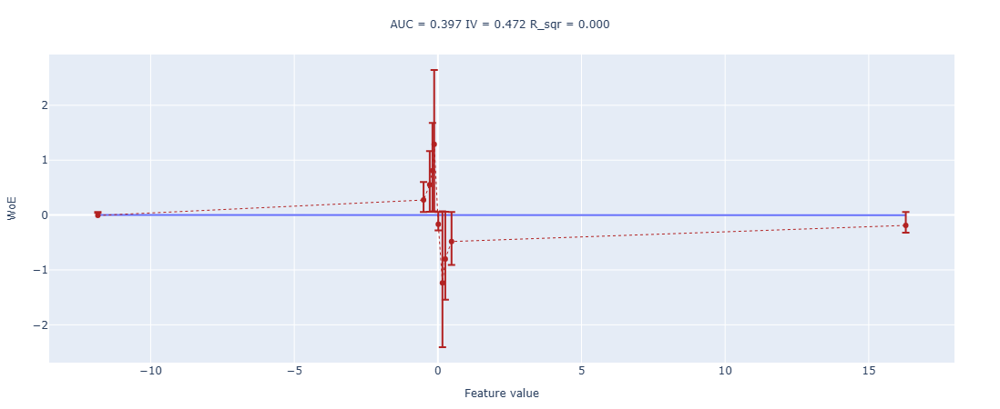


feature_2 | сегмент B (feature_15_binary = 1)


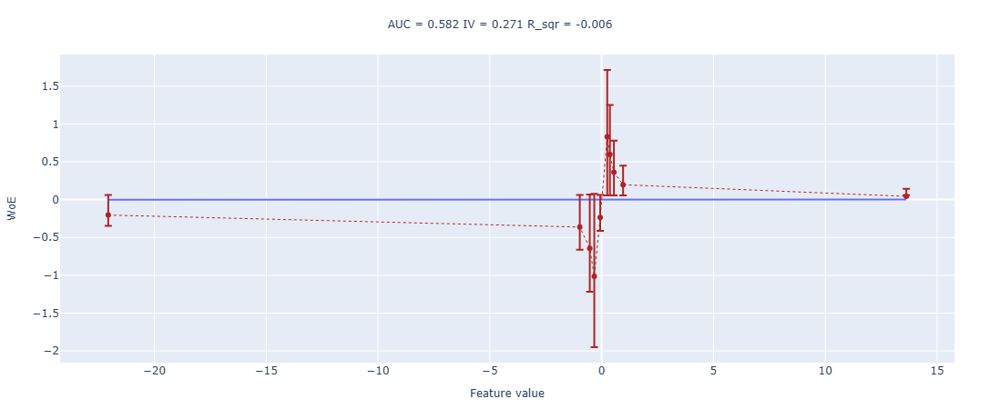


feature_3 | сегмент A (feature_15_binary = 0)


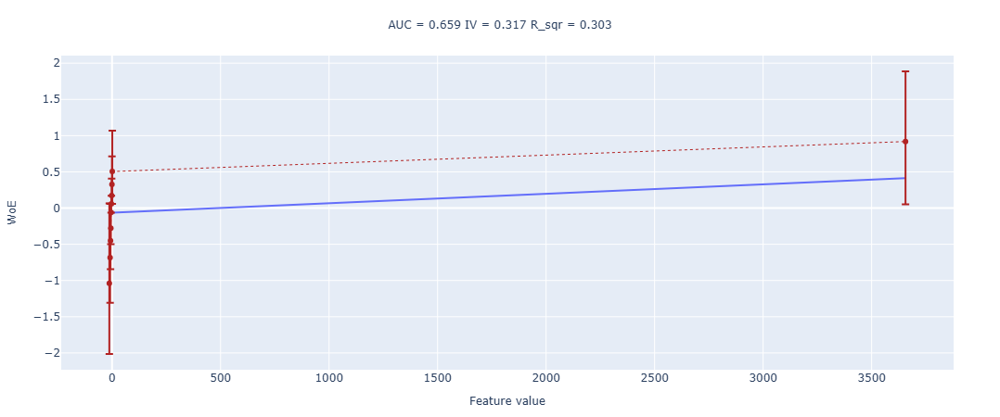


feature_3 | сегмент B (feature_15_binary = 1)


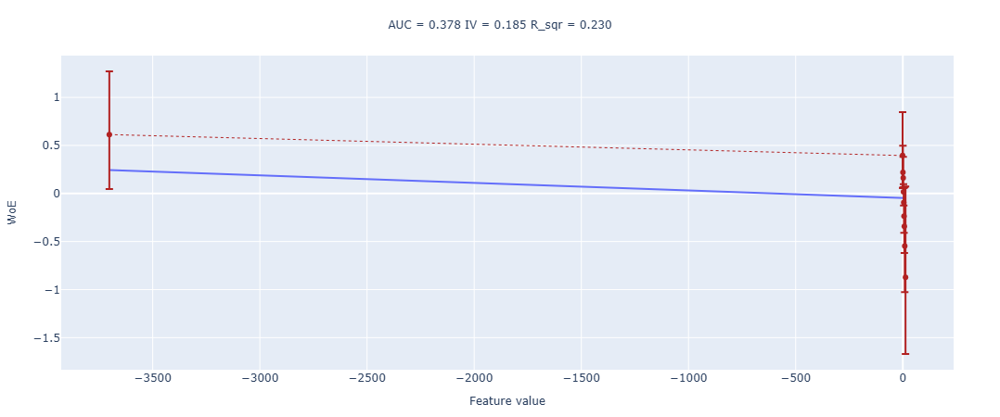


feature_4 | сегмент A (feature_15_binary = 0)


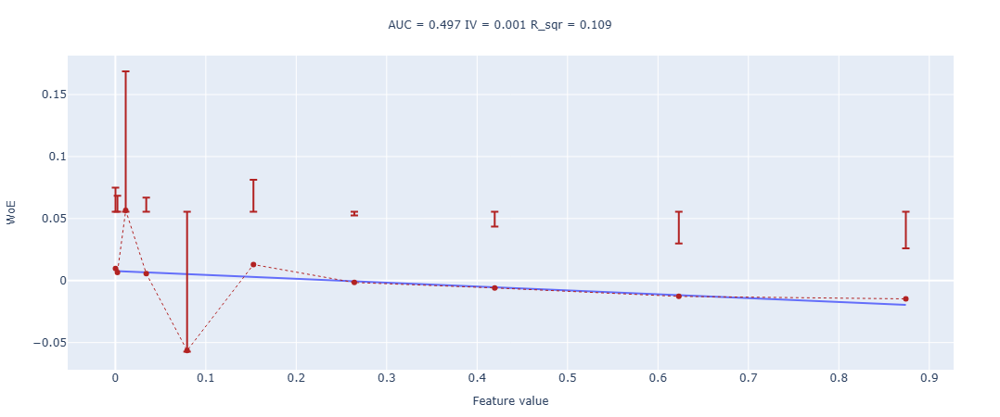


feature_4 | сегмент B (feature_15_binary = 1)


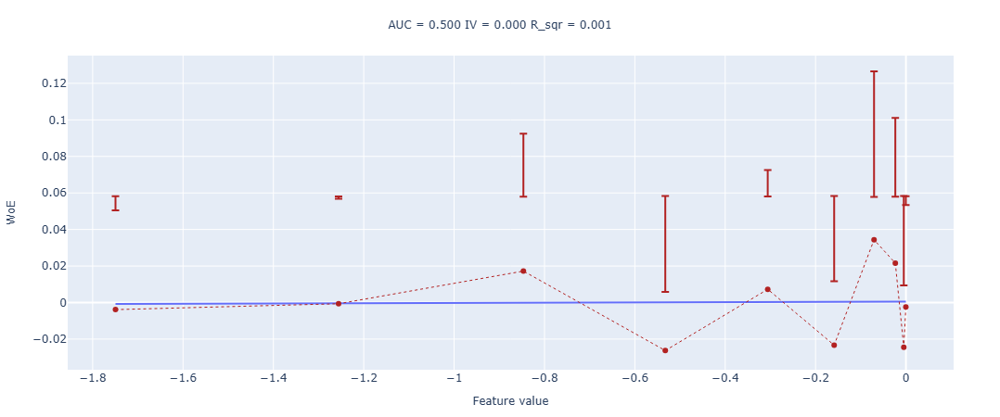


feature_5 | сегмент A (feature_15_binary = 0)


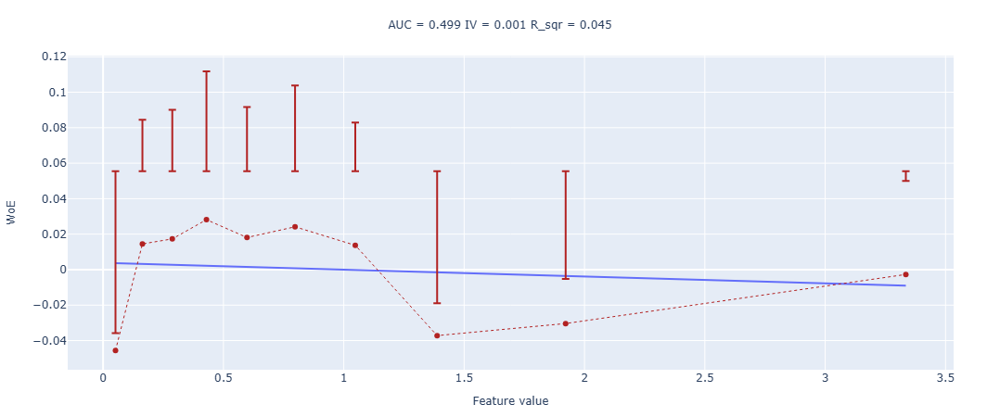


feature_5 | сегмент B (feature_15_binary = 1)


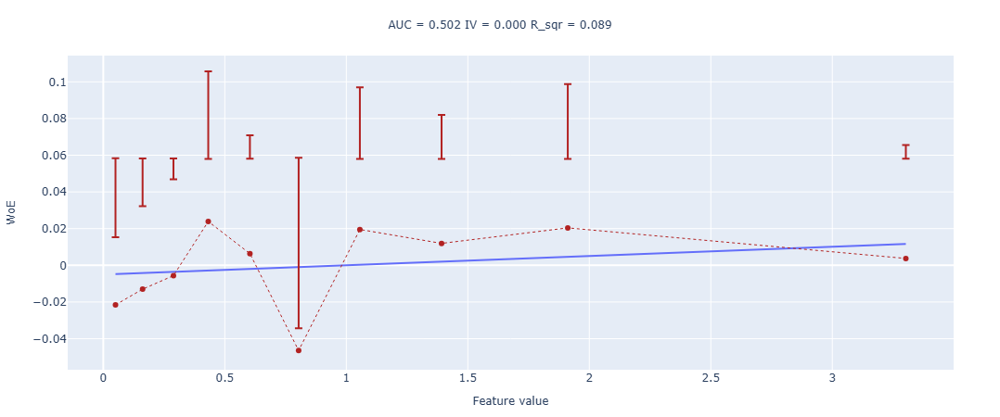


feature_6 | сегмент A (feature_15_binary = 0)


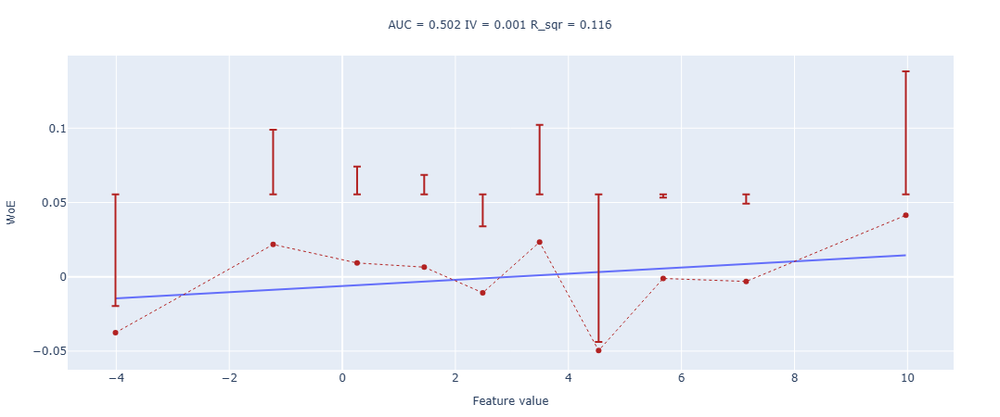


feature_6 | сегмент B (feature_15_binary = 1)


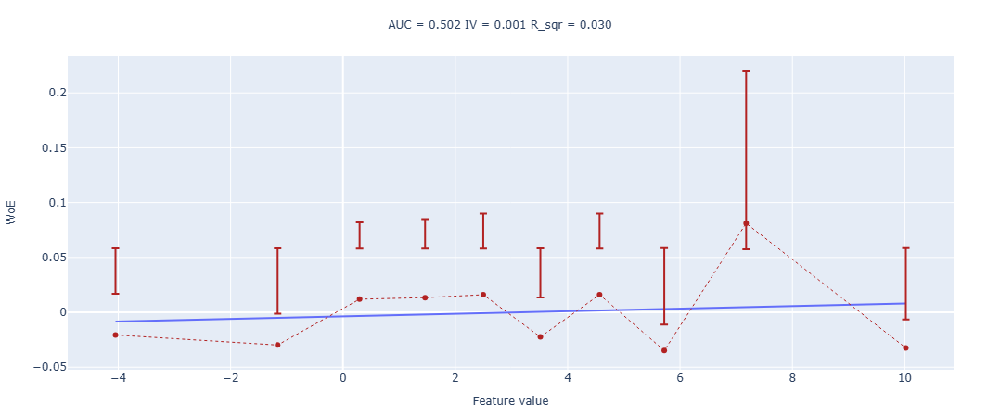


feature_8 | сегмент A (feature_15_binary = 0)


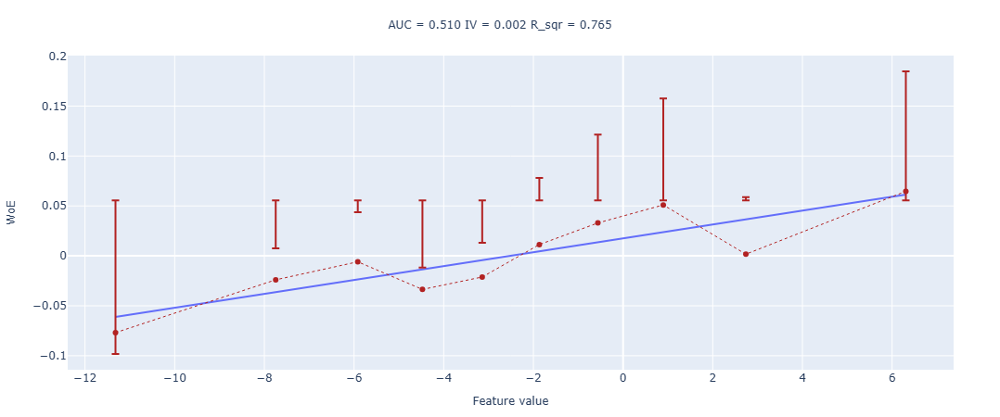


feature_8 | сегмент B (feature_15_binary = 1)


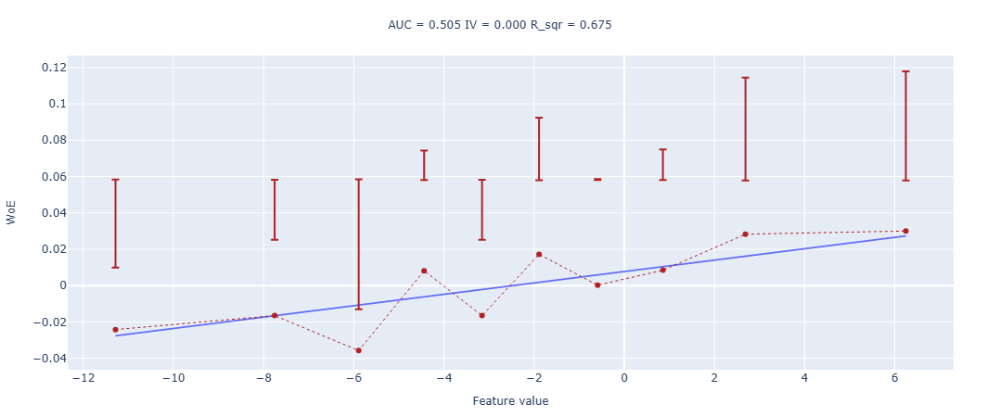


feature_9 | сегмент A (feature_15_binary = 0)


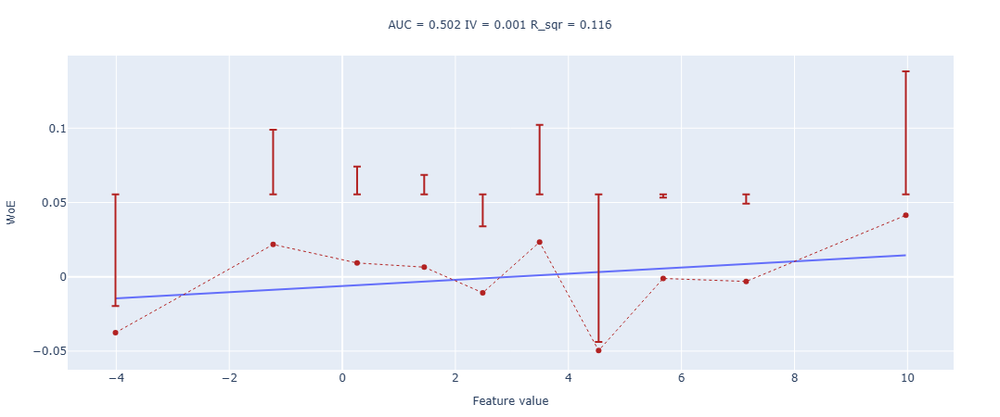


feature_9 | сегмент B (feature_15_binary = 1)


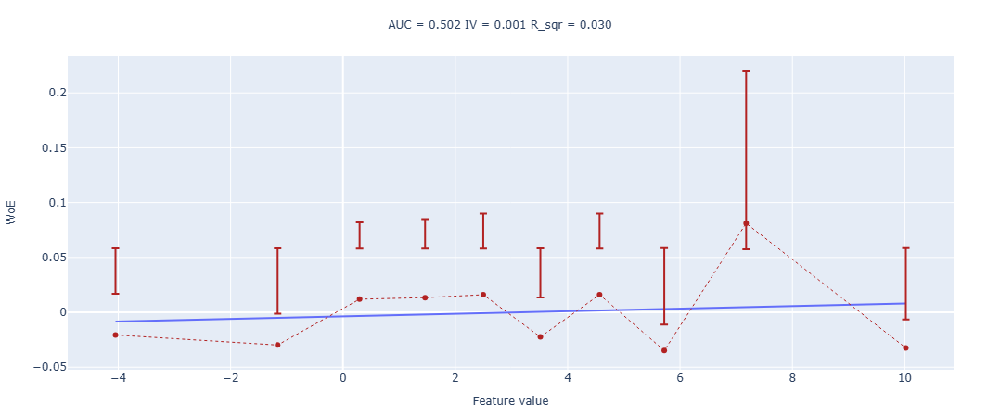


feature_10 | сегмент A (feature_15_binary = 0)


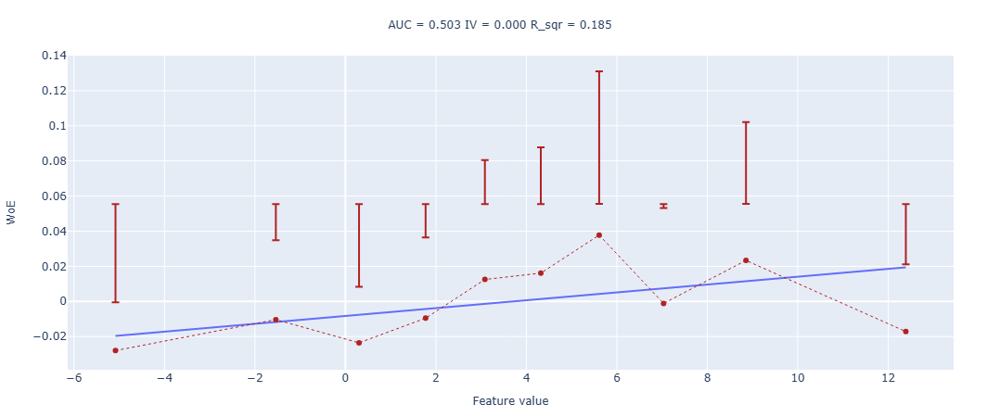


feature_10 | сегмент B (feature_15_binary = 1)


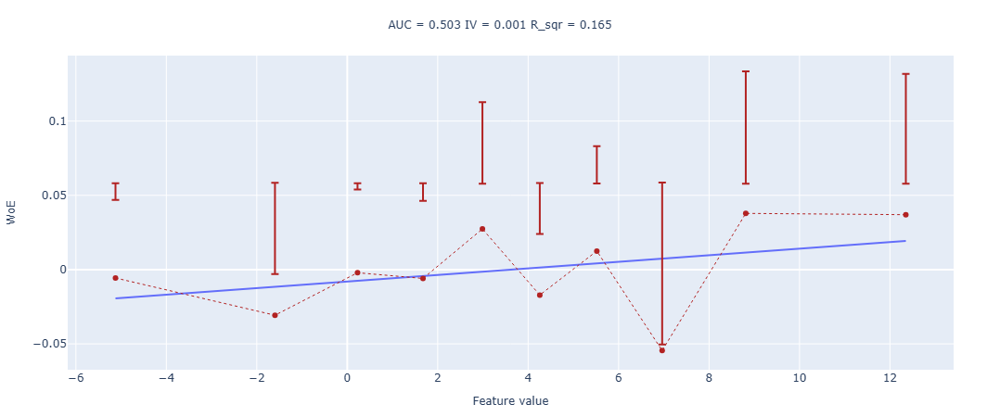


feature_11 | сегмент A (feature_15_binary = 0)


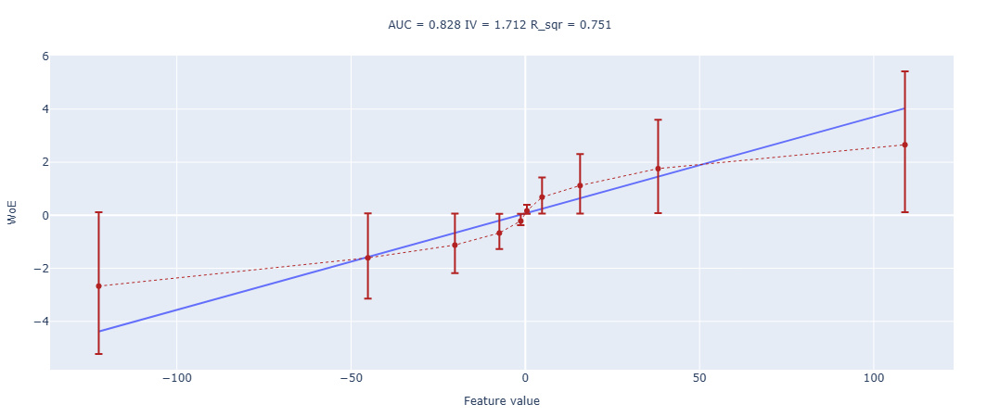


feature_11 | сегмент B (feature_15_binary = 1)


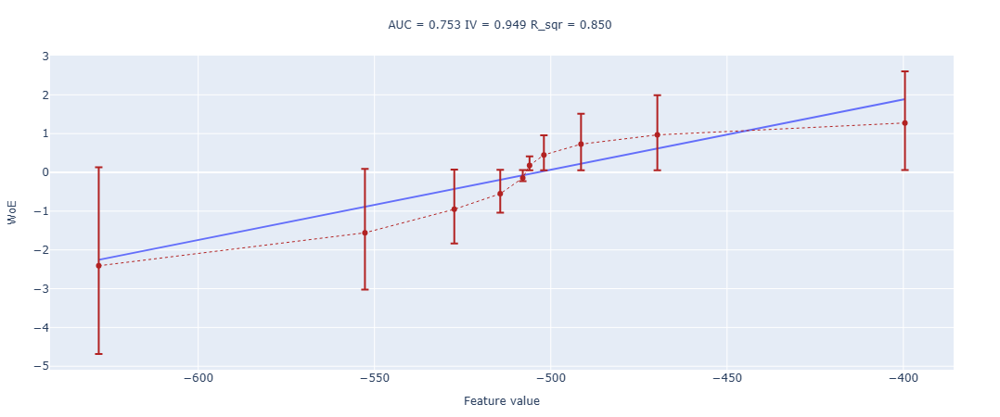


feature_12 | сегмент A (feature_15_binary = 0)


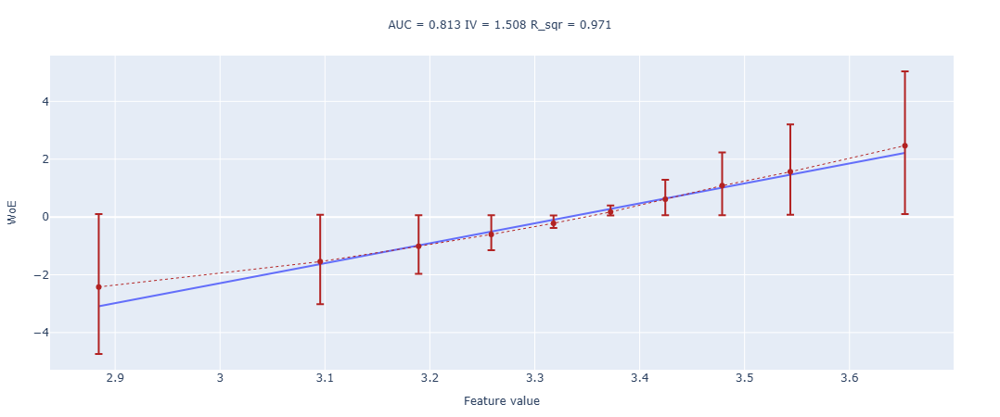


feature_12 | сегмент B (feature_15_binary = 1)


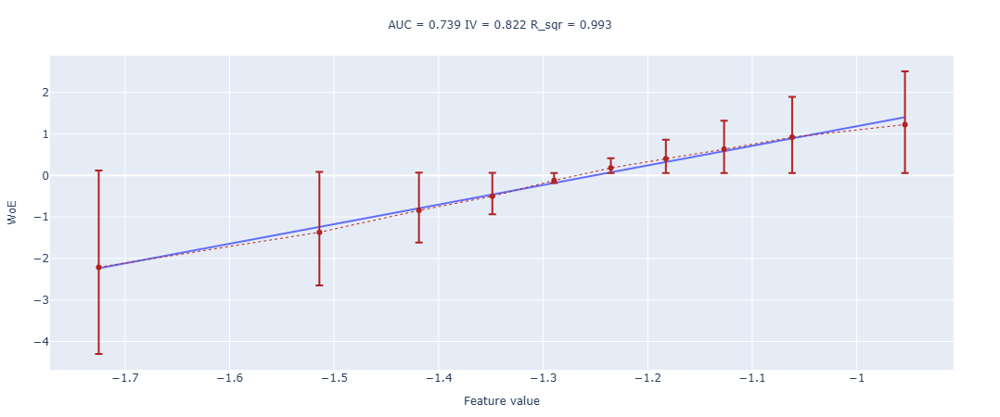


feature_13 | сегмент A (feature_15_binary = 0)


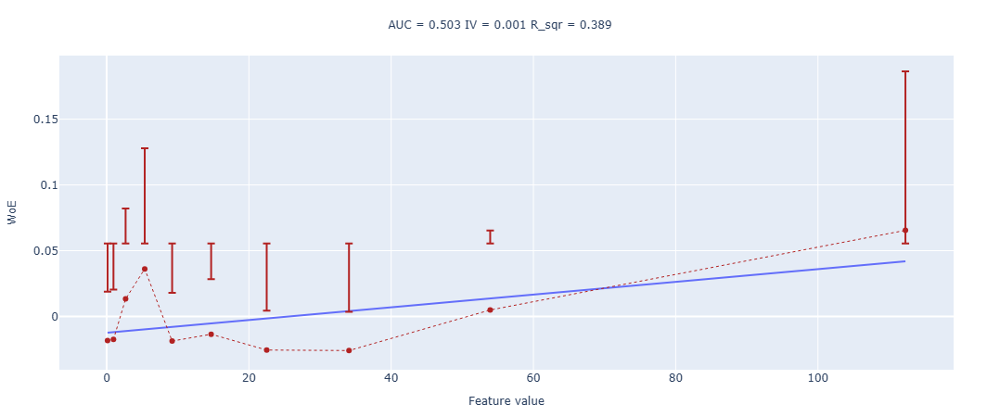


feature_13 | сегмент B (feature_15_binary = 1)


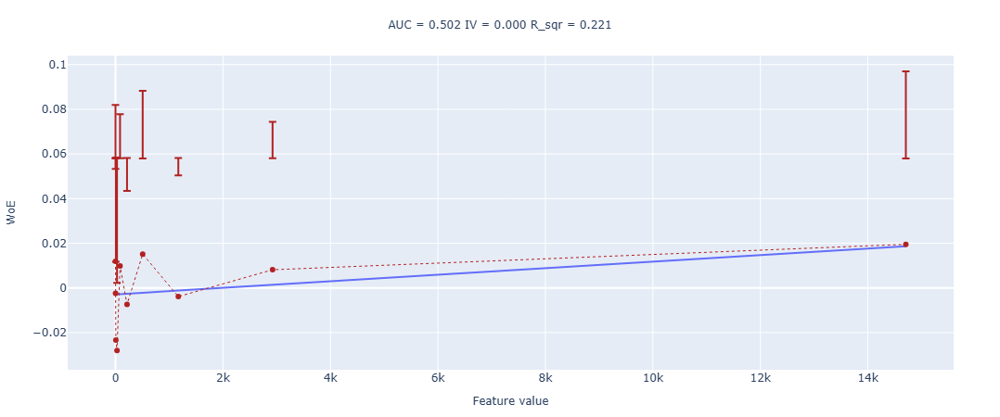


feature_14 | сегмент A (feature_15_binary = 0)


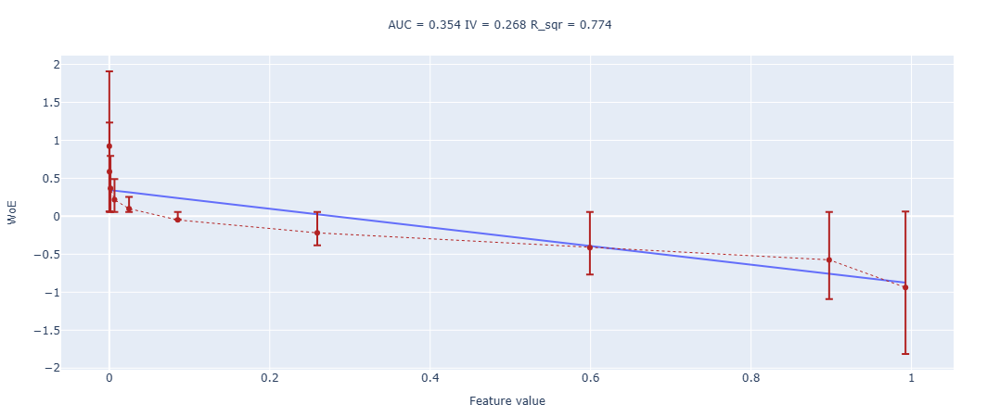


feature_14 | сегмент B (feature_15_binary = 1)


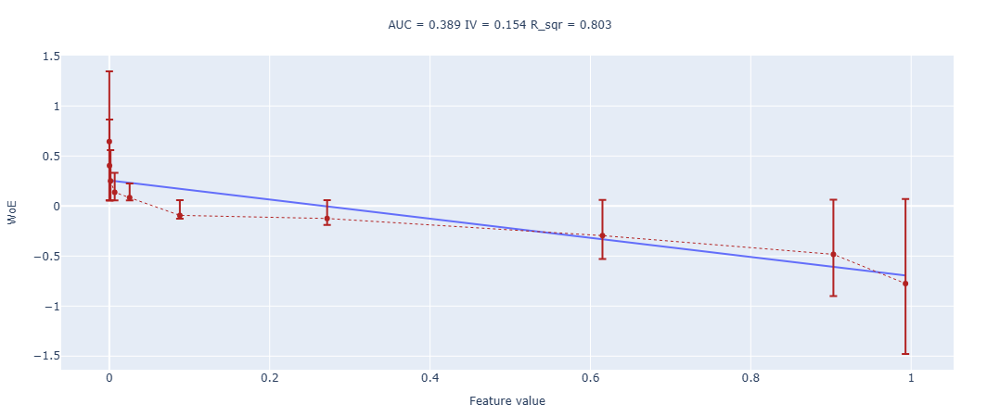


feature_7 | сегмент A (feature_15_binary = 0)


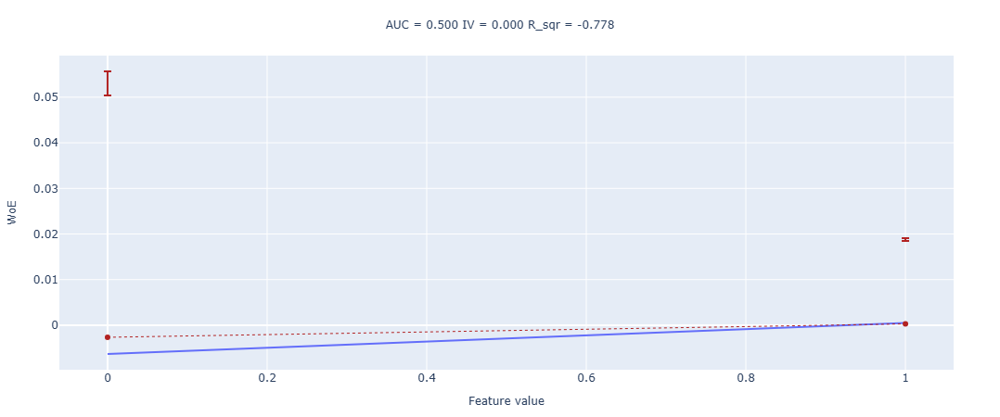


feature_7 | сегмент B (feature_15_binary = 1)


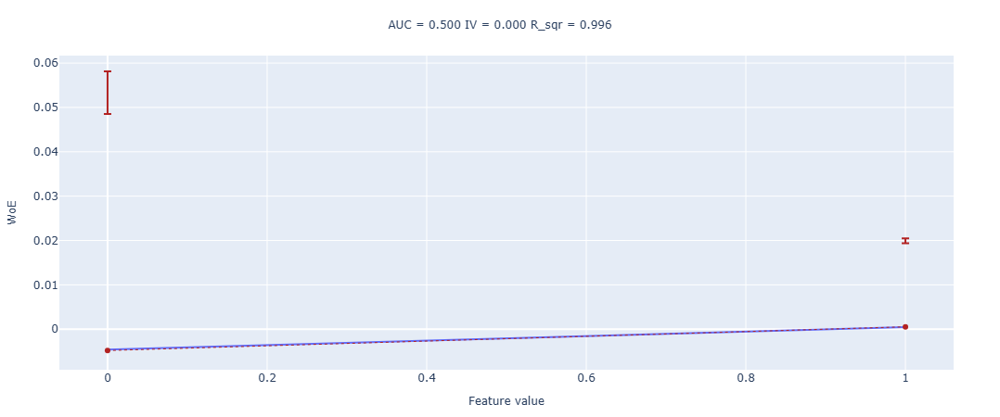

In [97]:
for feature in model_features:
    if feature in ['feature_15_binary', 'feature_15_binary_cb']:
        continue

    print(f'\n{feature} | сегмент A (feature_15_binary = 0)')

    fig_A = woe_line(
        values=df_A[feature].values,
        target=df_A['d4p12'].values,
        n_buckets=10
    )
    fig_A.show()

    print(f'\n{feature} | сегмент B (feature_15_binary = 1)')

    fig_B = woe_line(
        values=df_B[feature].values,
        target=df_B['d4p12'].values,
        n_buckets=10
    )
    fig_B.show()

#### Логарифмируем


feature_1_log | сегмент A (ПОСЛЕ логарифмирования)


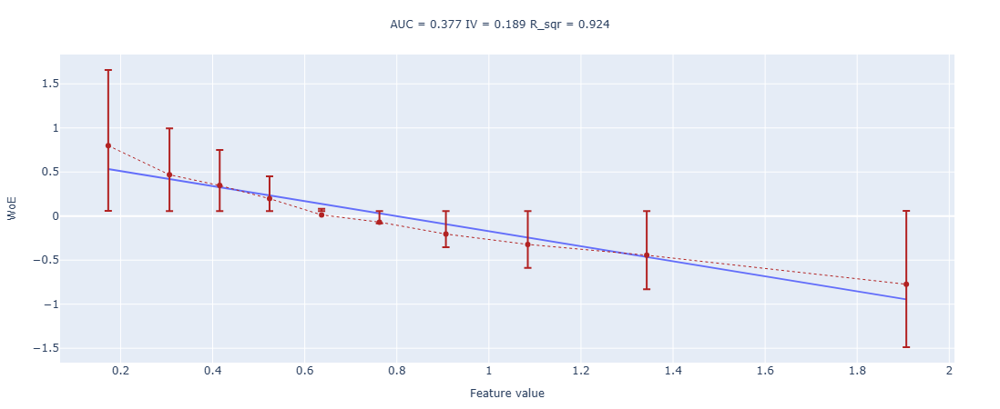


feature_1_log | сегмент B (ПОСЛЕ логарифмирования)


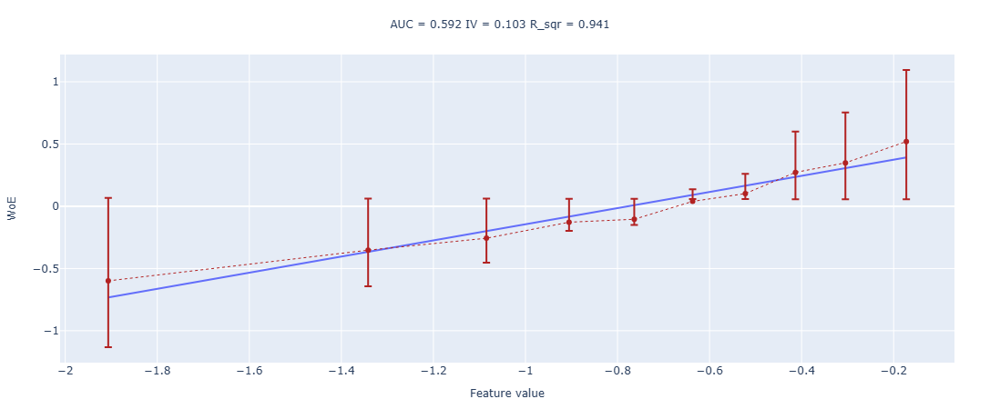


feature_2_log | сегмент A (ПОСЛЕ логарифмирования)


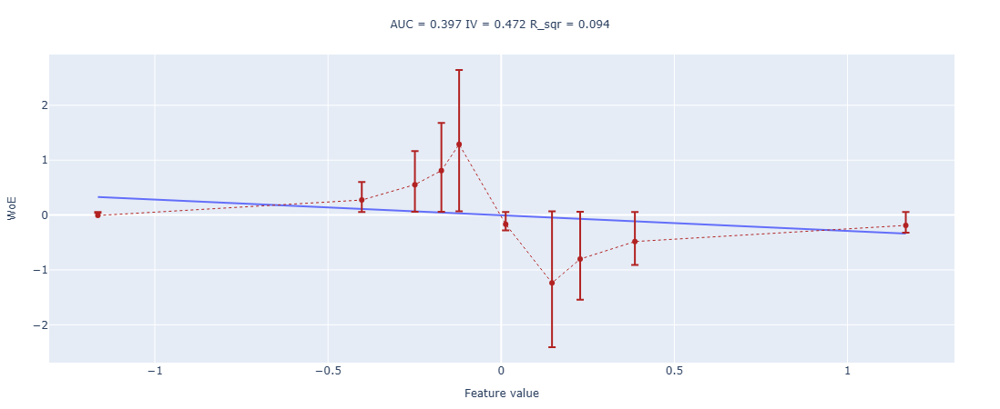


feature_2_log | сегмент B (ПОСЛЕ логарифмирования)


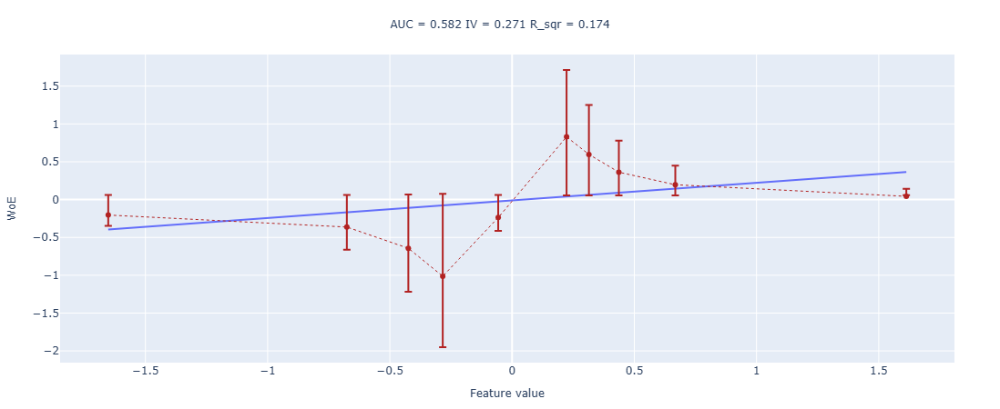


feature_3_log | сегмент A (ПОСЛЕ логарифмирования)


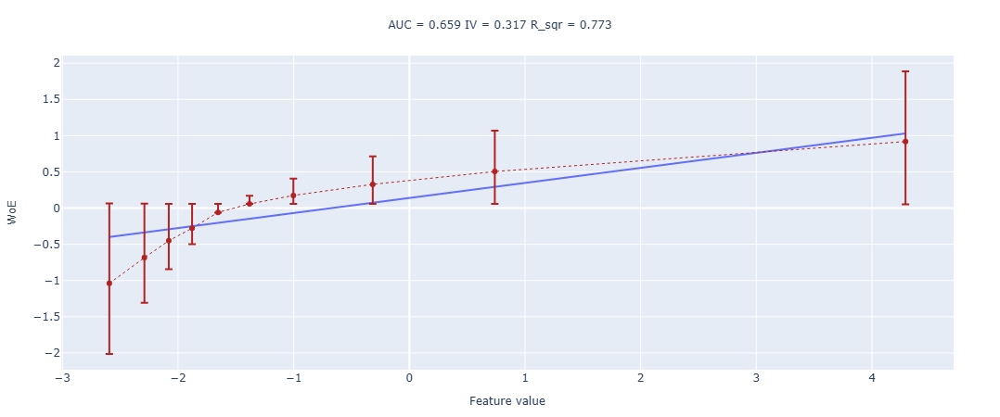


feature_3_log | сегмент B (ПОСЛЕ логарифмирования)


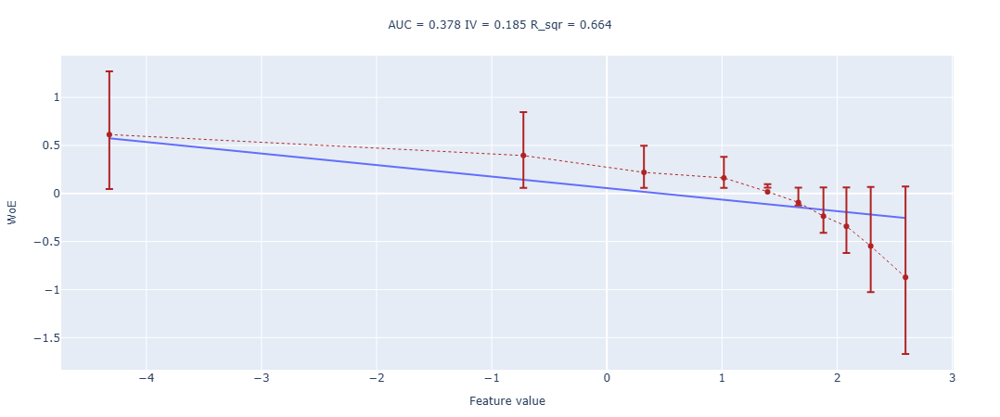


feature_4_log | сегмент A (ПОСЛЕ логарифмирования)


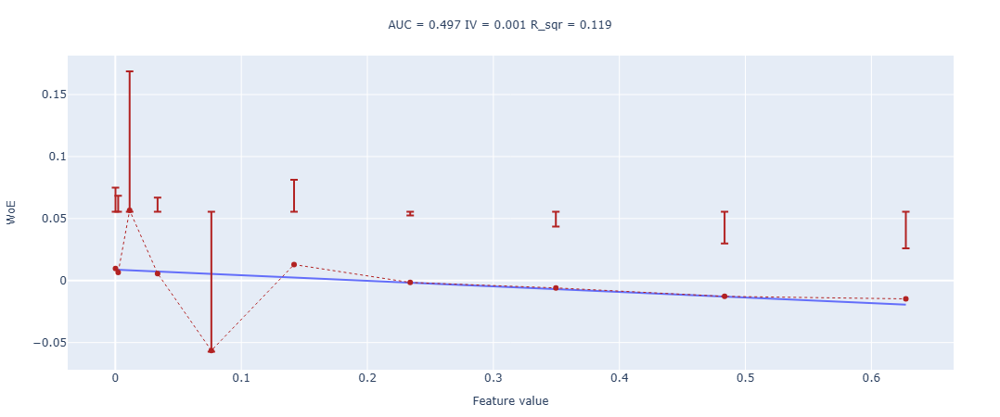


feature_4_log | сегмент B (ПОСЛЕ логарифмирования)


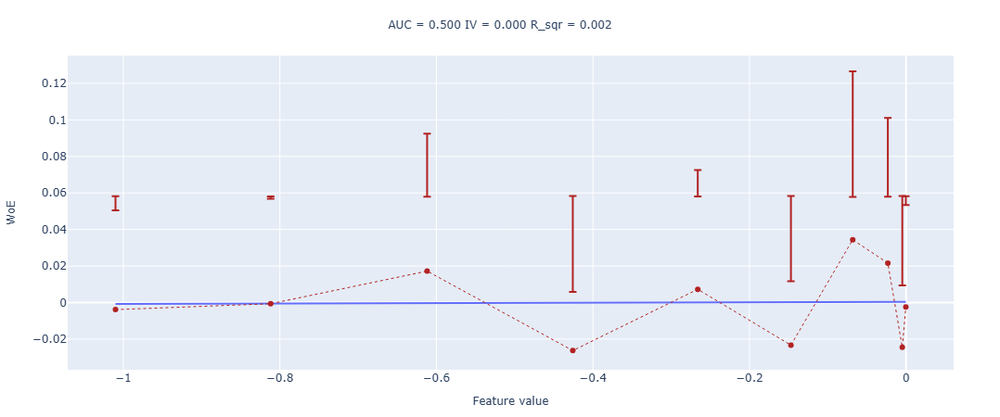


feature_5_log | сегмент A (ПОСЛЕ логарифмирования)


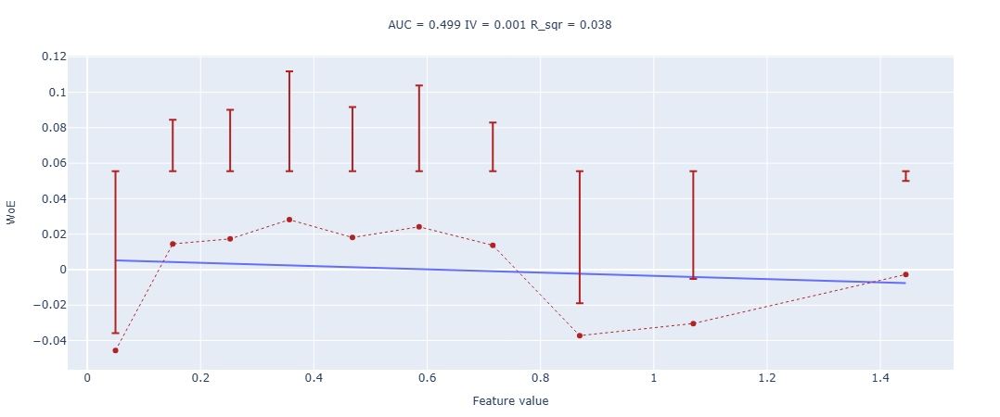


feature_5_log | сегмент B (ПОСЛЕ логарифмирования)


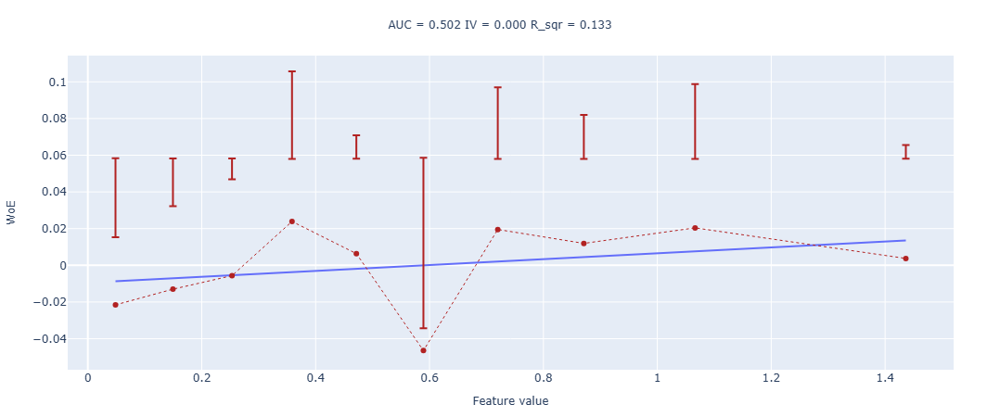


feature_6_log | сегмент A (ПОСЛЕ логарифмирования)


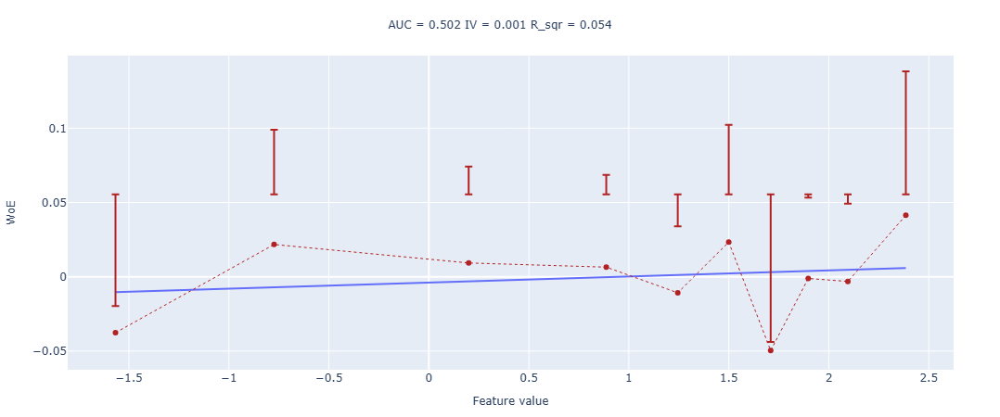


feature_6_log | сегмент B (ПОСЛЕ логарифмирования)


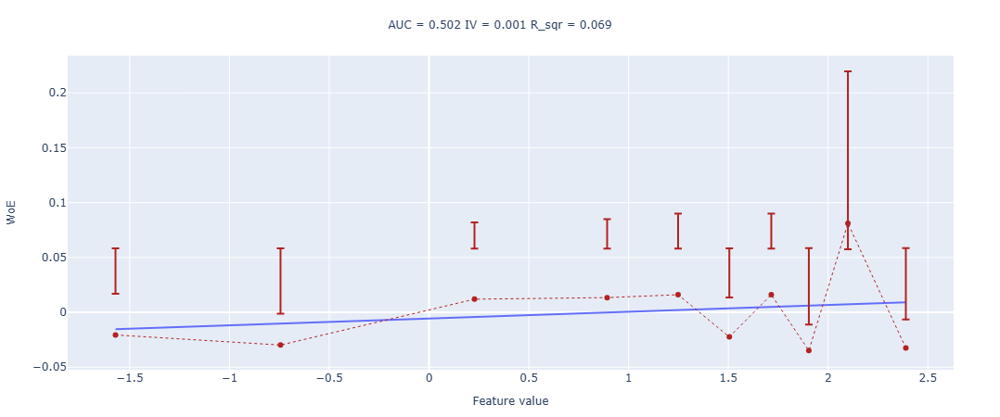


feature_8_log | сегмент A (ПОСЛЕ логарифмирования)


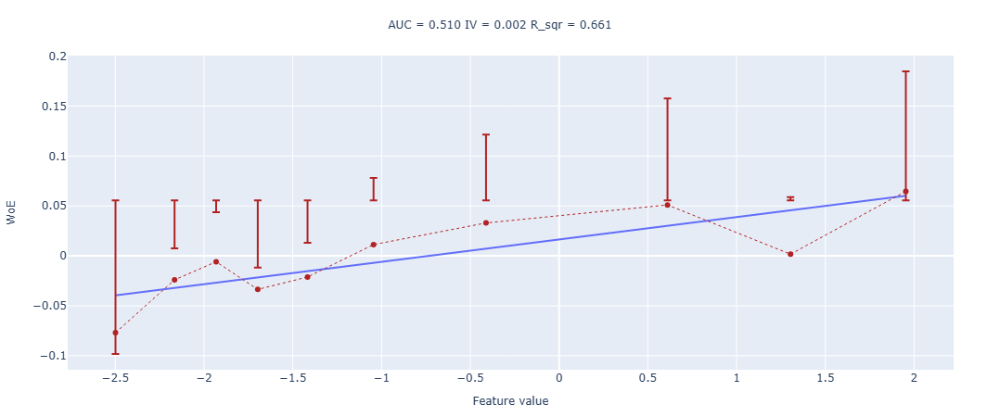


feature_8_log | сегмент B (ПОСЛЕ логарифмирования)


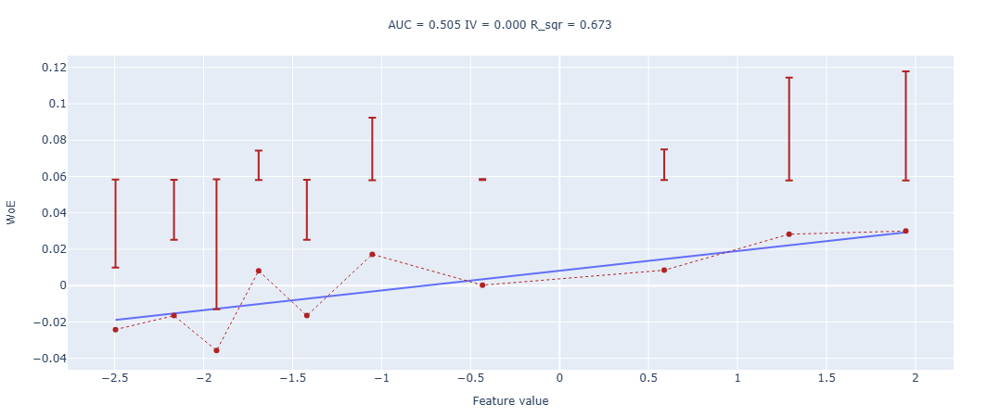


feature_9_log | сегмент A (ПОСЛЕ логарифмирования)


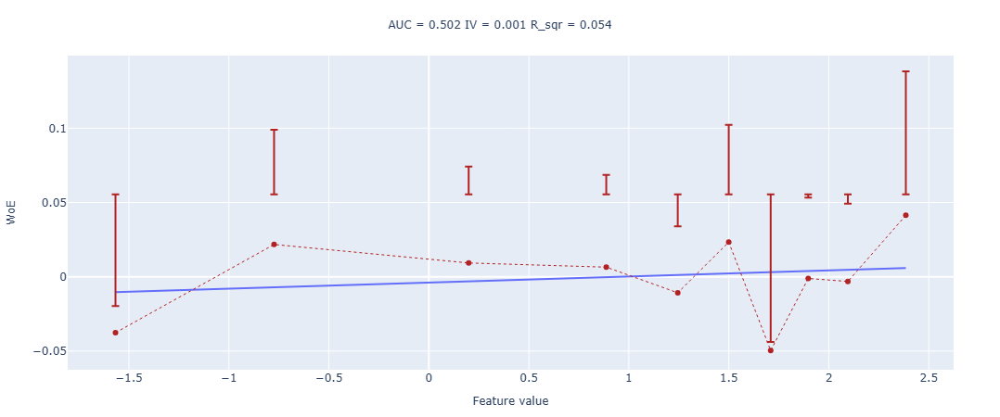


feature_9_log | сегмент B (ПОСЛЕ логарифмирования)


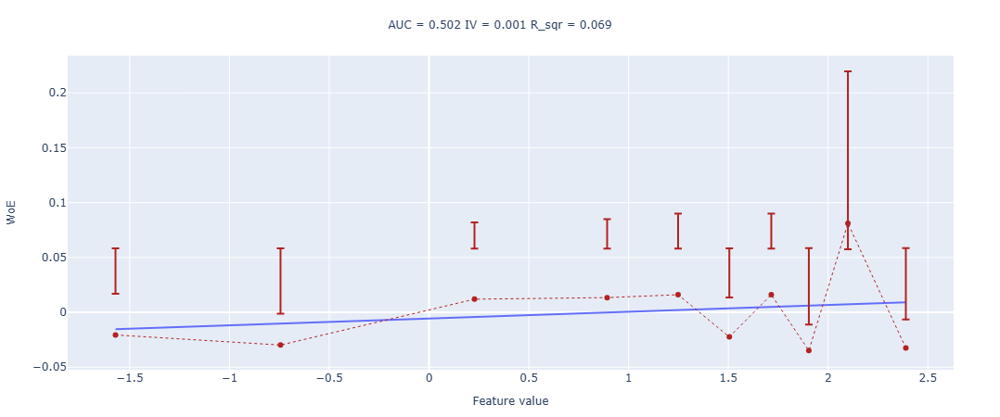


feature_10_log | сегмент A (ПОСЛЕ логарифмирования)


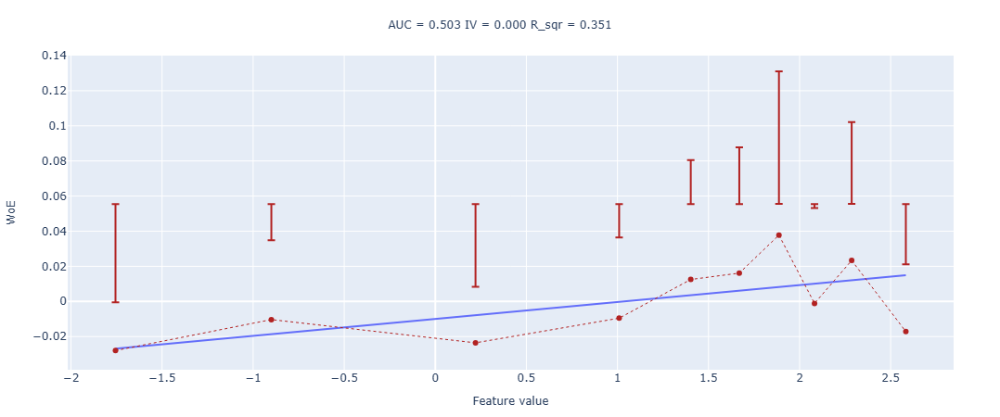


feature_10_log | сегмент B (ПОСЛЕ логарифмирования)


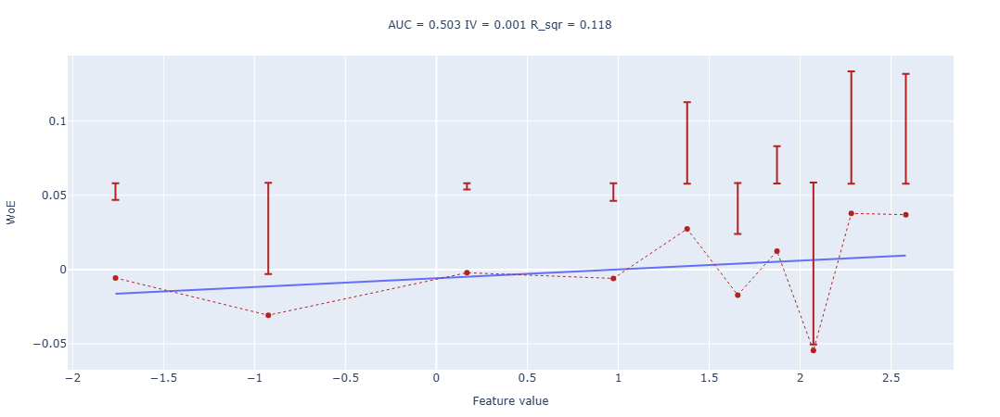


feature_11_log | сегмент A (ПОСЛЕ логарифмирования)


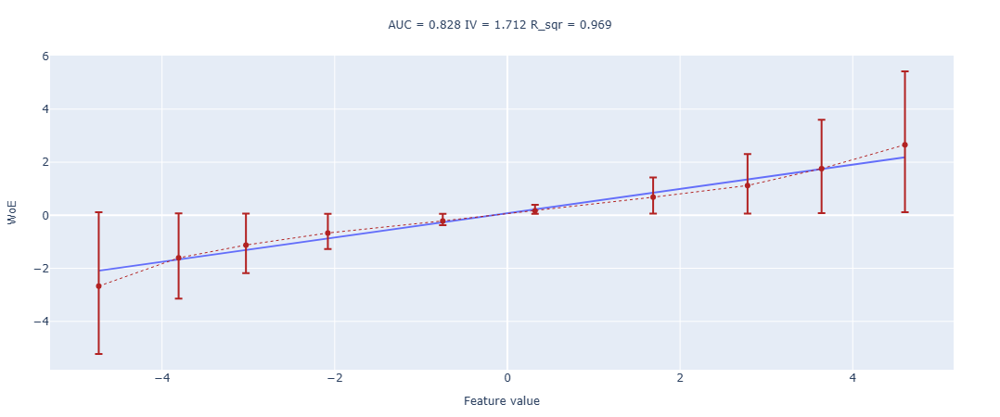


feature_11_log | сегмент B (ПОСЛЕ логарифмирования)


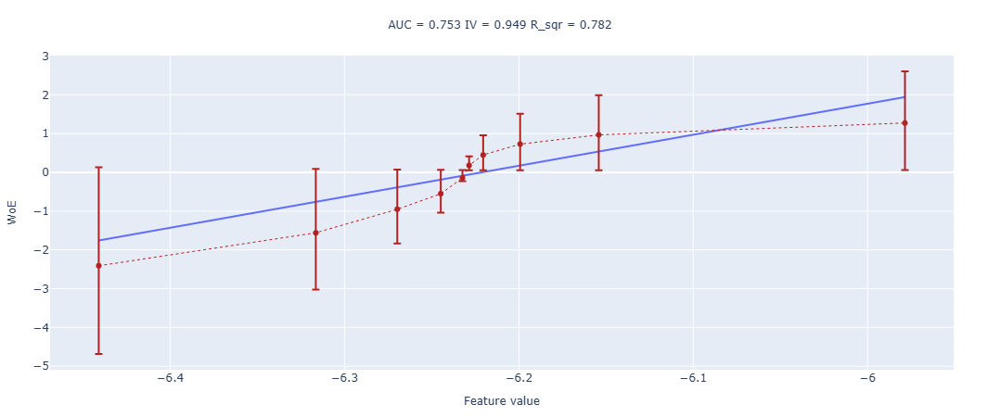


feature_12_log | сегмент A (ПОСЛЕ логарифмирования)


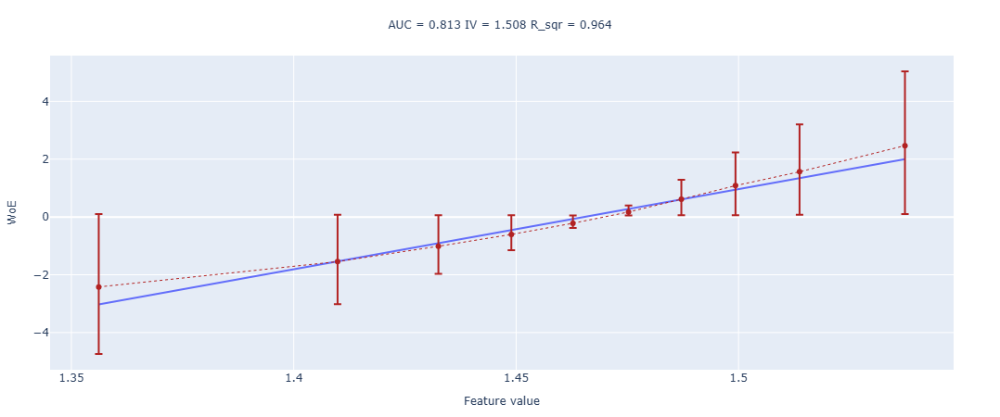


feature_12_log | сегмент B (ПОСЛЕ логарифмирования)


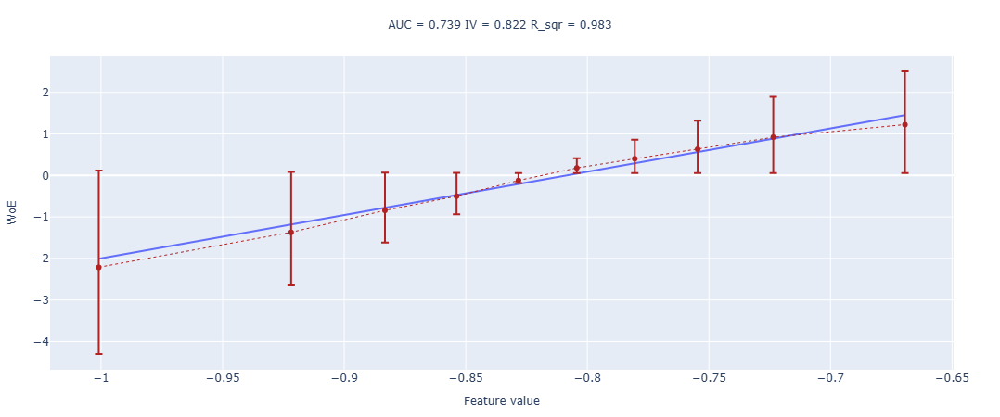


feature_13_log | сегмент A (ПОСЛЕ логарифмирования)


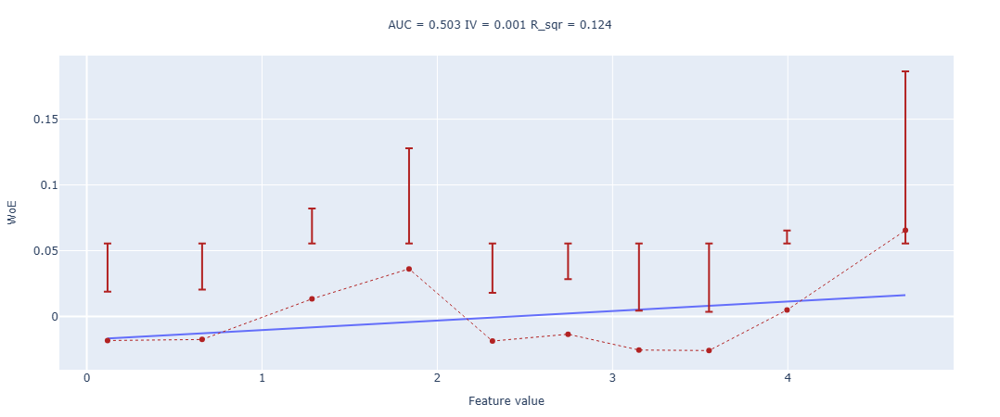


feature_13_log | сегмент B (ПОСЛЕ логарифмирования)


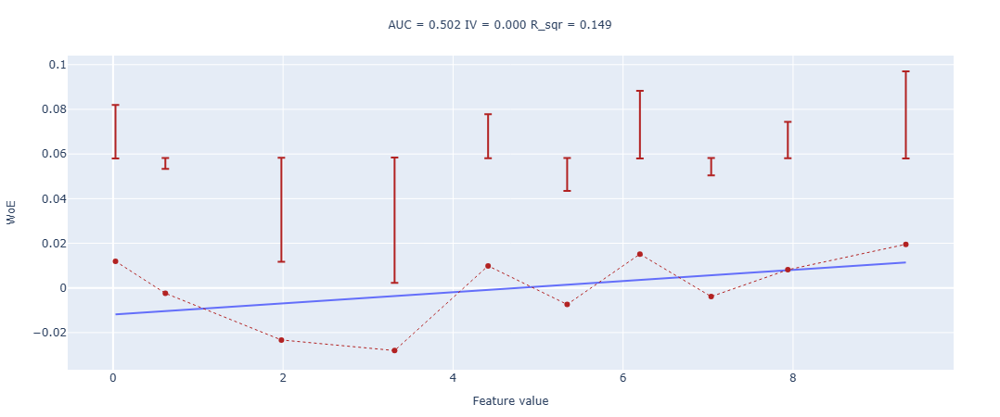


feature_14_log | сегмент A (ПОСЛЕ логарифмирования)


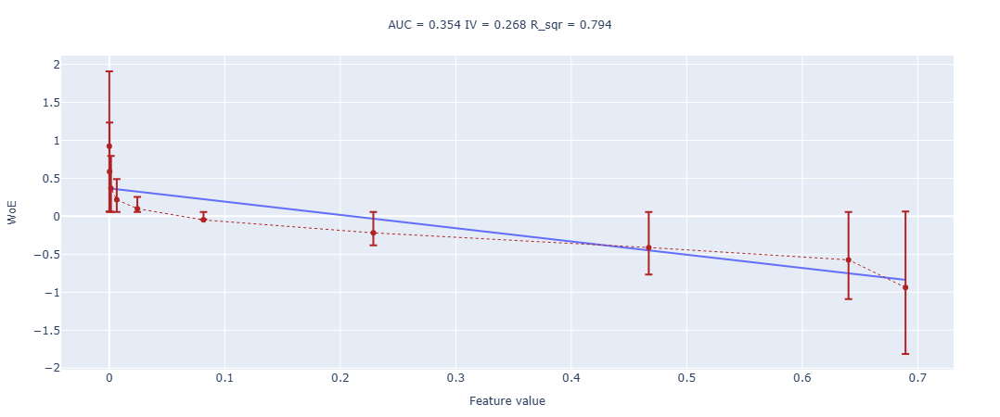


feature_14_log | сегмент B (ПОСЛЕ логарифмирования)


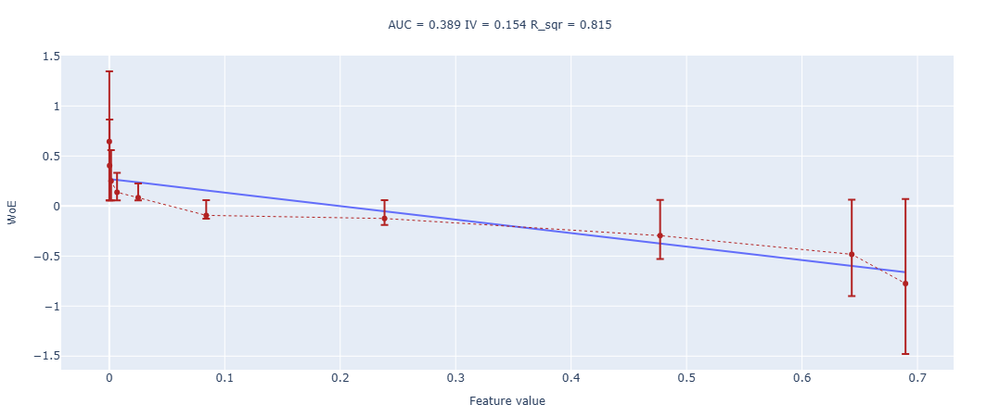


feature_7_log | сегмент A (ПОСЛЕ логарифмирования)


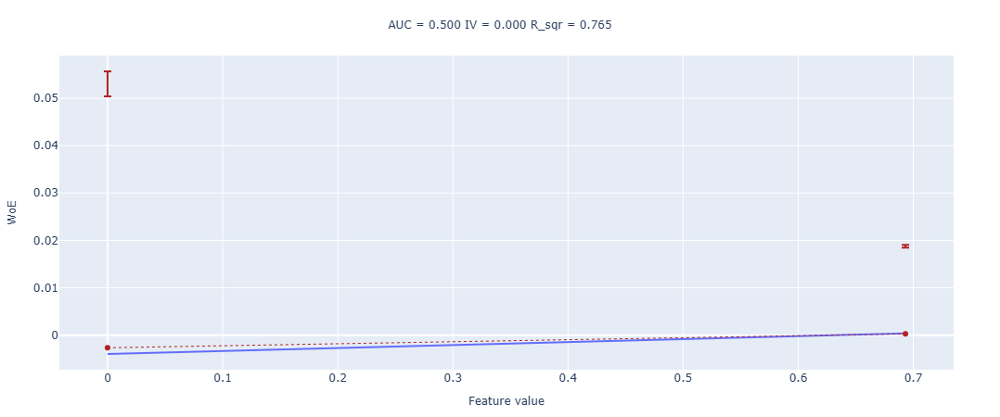


feature_7_log | сегмент B (ПОСЛЕ логарифмирования)


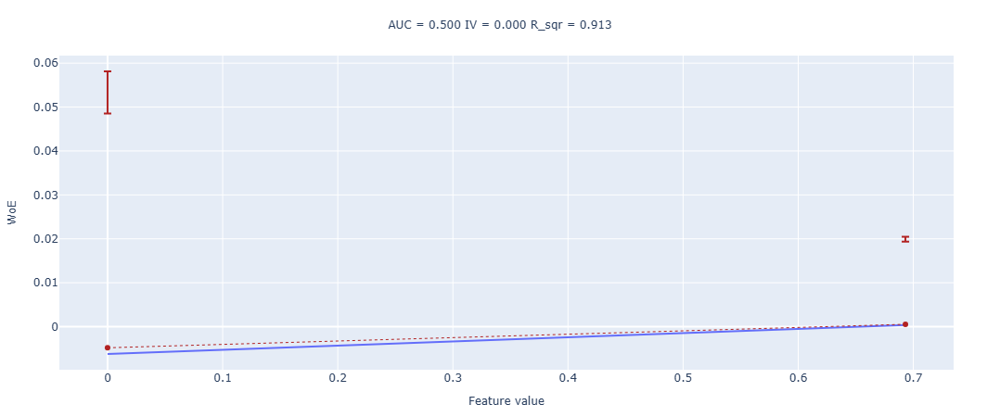

In [99]:
def signed_log(x: pd.Series) -> pd.Series:
    return np.sign(x) * np.log1p(np.abs(x))

log_features = []

for feature in model_features:
    if feature in ['feature_15_binary', 'feature_15_binary_cb']:
        continue

    new_col = f'{feature}_log'
    df[new_col] = signed_log(df[feature])
    log_features.append(new_col)

df_A = df[df['feature_15_binary'] == 0]
df_B = df[df['feature_15_binary'] == 1]

for feature in log_features:
    print(f'\n{feature} | сегмент A (ПОСЛЕ логарифмирования)')
    woe_line(
        values=df_A[feature].values,
        target=df_A['d4p12'].values,
        n_buckets=10
    ).show()

    print(f'\n{feature} | сегмент B (ПОСЛЕ логарифмирования)')
    woe_line(
        values=df_B[feature].values,
        target=df_B['d4p12'].values,
        n_buckets=10
    ).show()

In [100]:
for feature in model_features:
    if feature in ['feature_15_binary', 'feature_15_binary_cb']:
        continue

    feature_log = f'{feature}_log'

    print(f'\n{feature} — ДО')

    print(f'{feature} | A')
    buckets_A = calc_buckets(df_A[feature].values, 10)
    print(calc_plot_title(
        df_A[feature].values,
        df_A['d4p12'].values,
        buckets_A
    ))

    print(f'{feature} | B')
    buckets_B = calc_buckets(df_B[feature].values, 10)
    print(calc_plot_title(
        df_B[feature].values,
        df_B['d4p12'].values,
        buckets_B
    ))

    if feature_log in df.columns:
        print(f'\n{feature_log} — ПОСЛЕ')

        print(f'{feature_log} | A')
        buckets_A_log = calc_buckets(df_A[feature_log].values, 10)
        print(calc_plot_title(
            df_A[feature_log].values,
            df_A['d4p12'].values,
            buckets_A_log
        ))

        print(f'{feature_log} | B')
        buckets_B_log = calc_buckets(df_B[feature_log].values, 10)
        print(calc_plot_title(
            df_B[feature_log].values,
            df_B['d4p12'].values,
            buckets_B_log
        ))


feature_1 — ДО
feature_1 | A
AUC = 0.377 IV = 0.189 R_sqr = 0.724 
feature_1 | B
AUC = 0.592 IV = 0.103 R_sqr = 0.750 

feature_1_log — ПОСЛЕ
feature_1_log | A
AUC = 0.377 IV = 0.189 R_sqr = 0.924 
feature_1_log | B
AUC = 0.592 IV = 0.103 R_sqr = 0.941 

feature_2 — ДО
feature_2 | A
AUC = 0.397 IV = 0.472 R_sqr = 0.000 
feature_2 | B
AUC = 0.582 IV = 0.271 R_sqr = -0.006 

feature_2_log — ПОСЛЕ
feature_2_log | A
AUC = 0.397 IV = 0.472 R_sqr = 0.094 
feature_2_log | B
AUC = 0.582 IV = 0.271 R_sqr = 0.174 

feature_3 — ДО
feature_3 | A
AUC = 0.659 IV = 0.317 R_sqr = 0.303 
feature_3 | B
AUC = 0.378 IV = 0.185 R_sqr = 0.230 

feature_3_log — ПОСЛЕ
feature_3_log | A
AUC = 0.659 IV = 0.317 R_sqr = 0.773 
feature_3_log | B
AUC = 0.378 IV = 0.185 R_sqr = 0.664 

feature_4 — ДО
feature_4 | A
AUC = 0.497 IV = 0.001 R_sqr = 0.109 
feature_4 | B
AUC = 0.500 IV = 0.000 R_sqr = 0.001 

feature_4_log — ПОСЛЕ
feature_4_log | A
AUC = 0.497 IV = 0.001 R_sqr = 0.119 
feature_4_log | B
AUC = 0.500 IV = 

#### Выводы: есть ЗНАЧИТЕЛЬНЫЕ положительные изменения почти по всем переменным!

### Задание 4. Финальная модель.

Обучите модели на признаках, которые вы отобрали и линеаризовали в задании 3. Пусть $logit_A$ – модель, обученная на сегменте $feature_{15} = A$. $logit_B$ – модель на втором сегменте. Тогда модель на всей выборке будем считать по формуле

$$
logit(x) = \mathbb I \{ feature_{15} = A \} \times logit_A(x) + \mathbb I \{ feature_{15} = B \} \times logit_B(x)
$$


Посчитайте для этой модели AUC и IV, оцените линейность на трейне и тесте. Сравните результаты с бейзлайном из задания 1.

Подсказка: если вы все сделали правильно, можно ожидать ROC AUC около 0.9 на тестовой выборке.

In [104]:
final_features = ['feature_11_log', 'feature_12_log']
segment_col = 'feature_15_binary'
target_col = 'd4p12'

In [105]:
X = df[final_features + [segment_col]]
y = df[target_col]

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

In [106]:
# train
train_A = X_train[X_train[segment_col] == 0]
train_B = X_train[X_train[segment_col] == 1]

y_train_A = y_train.loc[train_A.index]
y_train_B = y_train.loc[train_B.index]

# test
test_A = X_test[X_test[segment_col] == 0]
test_B = X_test[X_test[segment_col] == 1]

y_test_A = y_test.loc[test_A.index]
y_test_B = y_test.loc[test_B.index]

In [107]:
scaler_A = StandardScaler()
scaler_B = StandardScaler()

X_train_A_scaled = scaler_A.fit_transform(train_A[final_features])
X_train_B_scaled = scaler_B.fit_transform(train_B[final_features])

X_test_A_scaled = scaler_A.transform(test_A[final_features])
X_test_B_scaled = scaler_B.transform(test_B[final_features])

In [108]:
logit_A = LogisticRegression(max_iter=2000, solver='lbfgs')
logit_B = LogisticRegression(max_iter=2000, solver='lbfgs')

logit_A.fit(X_train_A_scaled, y_train_A)
logit_B.fit(X_train_B_scaled, y_train_B)

LogisticRegression(max_iter=2000)

In [109]:
proba_test = np.zeros(len(X_test))

# сегмент A
idx_A = test_A.index
proba_test[X_test.index.get_indexer(idx_A)] = (
    logit_A.predict_proba(X_test_A_scaled)[:, 1]
)

# сегмент B
idx_B = test_B.index
proba_test[X_test.index.get_indexer(idx_B)] = (
    logit_B.predict_proba(X_test_B_scaled)[:, 1]
)

In [110]:
buckets = calc_buckets(proba_test, n_buckets=10)

print(calc_plot_title(
    values=proba_test,
    target=y_test.values,
    buckets=buckets
))

AUC = 0.861 IV = 2.338 R_sqr = 0.923 


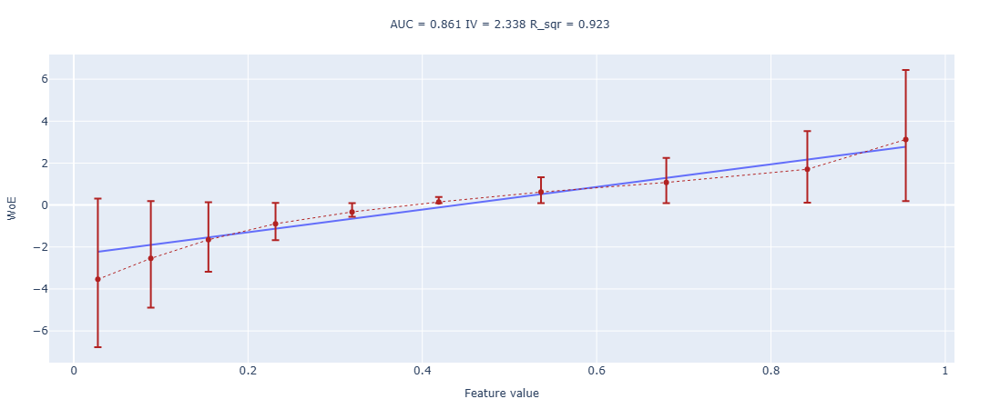

In [111]:
woe_line(
    values=proba_test,
    target=y_test.values,
    n_buckets=10
).show()

#### Выводы: значимых изменений нет, но метрика в порядке и при должной доработке решения можно получить достаточно хорошие результаты!

# Часть 3. Бонус. (3 балла)

На лекции мы накопили ряд упражнений, которые стоит решить для понимания происходившего. Вы можете $\TeX$ать их прямо в ноуте (или прикреплять картинки, если так удобнее).

#### **Упражнение 1**

Для определения $WoE$ мы пользовались Теоремой Байеса. Примените ее и **покажите, что верно равенство**:

$$
\ln \left(  \frac{P(x_i|y=1)}{P(x_i|y=0)} \right) = ... = \ln \left( \frac{P(y=1|x_i)}{P(y=0|x_i)} \right) - \ln \left( \frac{P(y=1)}{P(y=0)} \right)
$$

```
your solution here
```

#### Решение

**Теорема Байеса:**
$$P(A|B) = \frac{P(B|A)P(A)}{P(B)}$$

Решаем задачу $P(y=k|X_i)$, где:
- $k = \{0, 1\}$
- $X$ — выборка признаков
- $X_i$ — реализация по $i$-ой строке (для объекта $i$)

**Значит:**
$P(y=k|X_i) = \frac{P(X_i|y=k)P(y=k)}{P(X_i)}$ — решение задачи лог. регр.

Нас интересует $WoE$:
$P(X_i|y=k) = \frac{P(y=k|X_i)P(X_i)}{P(y=k)} \Rightarrow$

$$\frac{P(X_i|y=1)}{P(X_i|y=0)} = \frac{P(y=1|X_i)P(X_i)}{P(y=1)} \cdot \frac{P(y=0)}{P(y=0|X_i)P(X_i)} = \frac{P(y=1|X_i)P(y=0)}{P(y=1)P(y=0|X_i)}$$

Можно сразу логарифмировать:
$$\frac{P(y=1|X_i)P(y=0)}{P(y=1)P(y=0|X_i)} \Rightarrow$$

$$\ln \left( \frac{P(y=1|X_i)}{P(y=0|X_i)} \cdot \frac{P(y=0)}{P(y=1)} \right) = | \text{ по св-вам логарифма } | =$$

$$= \ln \left( \frac{P(y=1|X_i)}{P(y=0|X_i)} \right) + \ln \left( \frac{P(y=0)}{P(y=1)} \right) = | \text{ по св-вам логар. можно перев. дробь } | =$$

$$= \ln \left( \frac{P(y=1|X_i)}{P(y=0|X_i)} \right) - \ln \left( \frac{P(y=1)}{P(y=0)} \right)$$

**ч.т.д.**

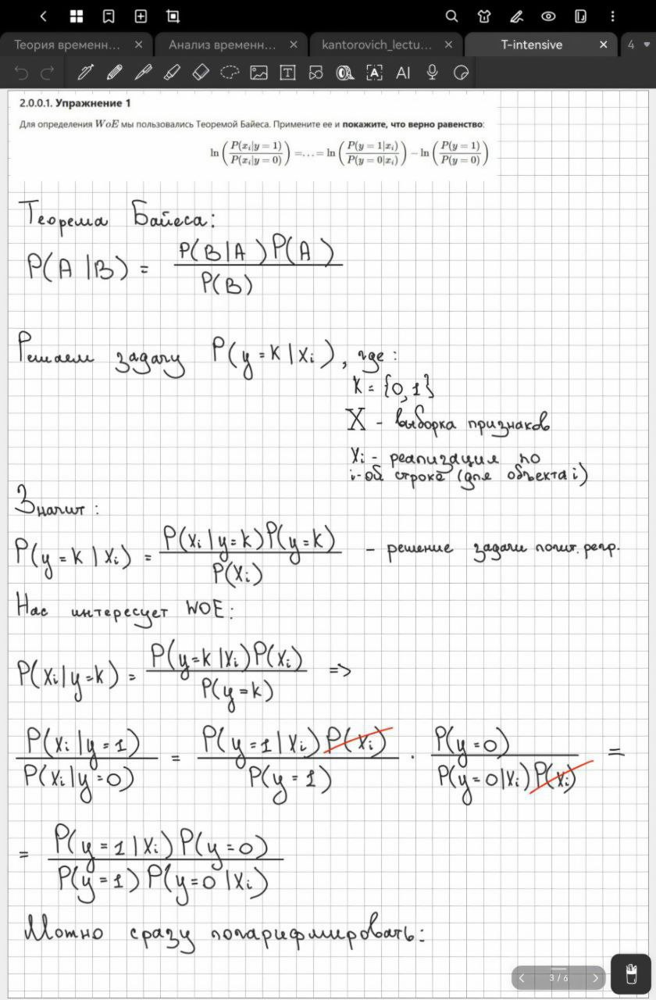

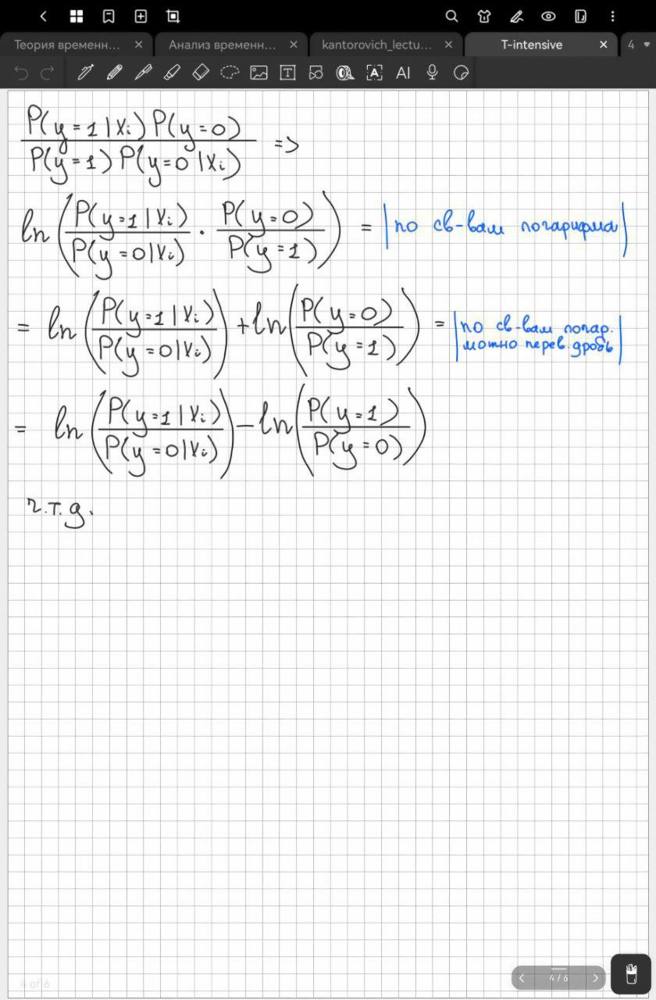

In [118]:
display(Image(filename="solution_picture1.1.jpg"))
display(Image(filename="solution_picture1.2.jpg"))

#### **Упражнение 2**

Известно:

$WoE$ можно посчитать так:
$WoE_i(x_i) = \ln \Big ( \frac{B_i}{G_i} \Big ) - \ln \Big ( \frac{B}{G} \Big ) $

Частота выхода в дефолт:  $badrate = \frac{B}{B+G}; \quad badrate_i = \frac{B_i}{B_i+G_i}$

$
\sigma (x) = \frac{1}{1+e^{-x}}; \quad logit(x) = \ln \left( \frac{x}{1-x} \right)
$

**Покажите, что**
$WoE_i(x_i) = logit(badrate_i) - logit(badrate)$

```
your solution here
```

#### Решение

$B = bad$
$G = good$
$B_i$
$X = \frac{B_i}{B_i+G_i}$ (просто $\mathbb{P}$ "плохого" исх.)

$WoE_i(x_i) = logit(badrate_i) - logit(badrate)$
$WoE_i(x_i) = logit \left( \frac{B_i}{B_i+G_i} \right) - logit \left( \frac{B}{B+G} \right)$ — требуется показать

**По частям:**
$\ln \left( \frac{B_i}{G_i} \right) = logit(badrate_i)$

$$\Rightarrow logit(badrate_i) = \ln \left( \frac{\frac{B_i}{B_i+G_i}}{1 - \frac{B_i}{B_i+G_i}} \right) =$$
$$= \ln \left( \frac{B_i}{B_i+G_i} \cdot \frac{B_i+G_i}{B_i+G_i - B_i} \right) =$$
$$= \ln \left( \frac{B_i}{B_i+G_i} \cdot \frac{B_i+G_i}{G_i} \right) = \ln \left( \frac{B_i}{G_i} \right)$$

Вывод для $badrate$ без индекса $i$ аналогичен.

**Следовательно:**
$logit(badrate_i) = \ln \left( \frac{B_i}{G_i} \right)$
$logit(badrate) = \ln \left( \frac{B}{G} \right)$

$$WoE_i(x_i) = logit(badrate_i) - logit(badrate) =$$
$$= \ln \left( \frac{B_i}{G_i} \right) - \ln \left( \frac{B}{G} \right)$$ (исходное опр-е, **ч.т.д.**)

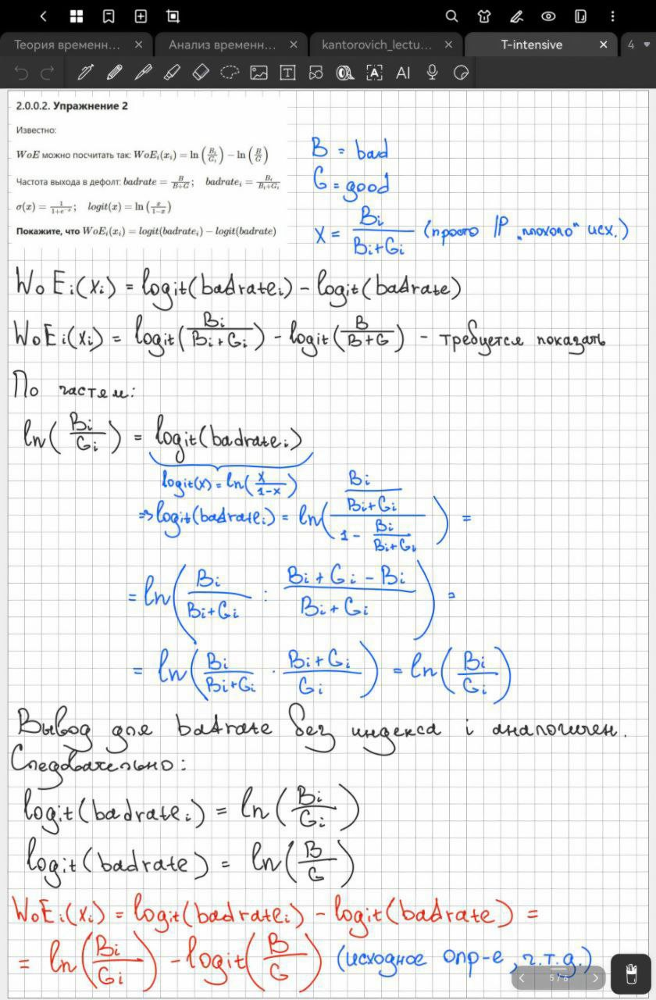

In [123]:
display(Image(filename="solution_picture2.jpg"))

#### **Упражнение 3**

Пусть даны два дискретных распределения: 

$B=(b_1, ..., b_n)$ и $G=(g_1, ..., g_n)$.

KL-дивергенция для дискретных распределений

$$D_{KL}(B||G) = \sum_{j=1}^{n} b_j \ln \left( \frac{b_j}{g_j} \right)$$


Пусть $x$ - дикретный признак, принмиающий значения $x_1,...,x_n$.
Известно определение IV через KL-дивергенцию:

$$
IV_x = D_{KL}(B_x||G_x)+D_{KL}(G_x||B_x)
$$
где 

$$
B_x (x_i) = P(x=x_i|y=1) = b_i; \quad G_x (x_i) = P(x=x_i|y=0) = g_i
$$

**Выразите $IV$ через $WoE$**





```
your solution here
```

#### Решение

$$D_{KL}(B || G) = \sum_{j=1}^{n} b_j \underbrace{\ln \left( \frac{b_j}{g_j} \right)}_{WoE_j}$$

И наоборот:  
$$D_{KL}(G || B) = \sum_{j=1}^{n} g_j \underbrace{\ln \left( \frac{g_j}{b_j} \right)}_{-WoE_j}$$

$$IV = D_{KL}(B_x || G_x) + D_{KL}(G_x || B_x) =$$  
$$= \sum_{j=1}^{n} b_j WoE_j - \sum_{j=1}^{n} g_j WoE_j =$$  
$$= \sum_{j=1}^{n} WoE_j (b_j - g_j) =$$  
$$= \sum_{j=1}^{n} \ln \left( \frac{b_j}{g_j} \right) (b_j - g_j)$$

**ч.т.д.**

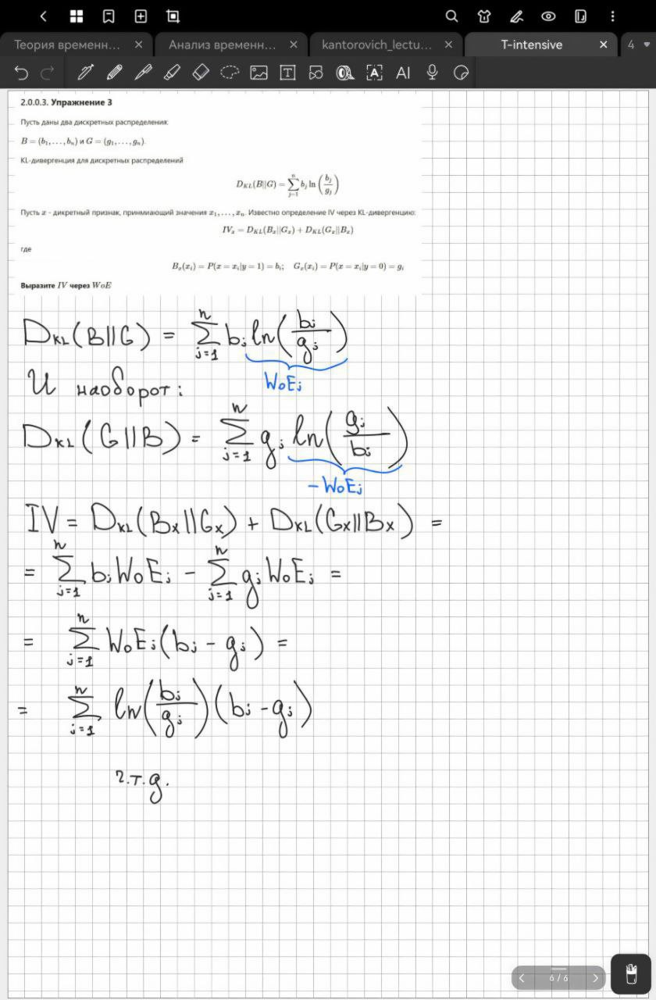

In [128]:
display(Image(filename="solution_picture3.jpg"))